In [1]:
from sklearn import linear_model
import numpy as np
import pandas as pd
from sklearn.svm import SVR
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from sklearn.model_selection import KFold,train_test_split,cross_val_predict
from sklearn.model_selection import GridSearchCV
from sklearn.decomposition import KernelPCA,PCA
import random
import copy
from time import *
from sklearn.preprocessing import minmax_scale,normalize,StandardScaler
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
df1 = pd.read_excel('E:/datas/ron.xlsx',sheet_name='Sheet2',)
y = np.array(df1['y_ron'])
y_sul = df1.iloc[:,1]
x = np.array(df1.iloc[:,2:])


In [347]:
y_sul = df1.iloc[:,1]

In [348]:
y_sul.shape

(325,)

In [3]:
df1.head()

,y_ron,y_sul,x1,x2,x3,x4,x5,x6,x7,x8,...,x356,x357,x358,x359,x360,x361,x362,x363,x364,x365
0,89.22,3.2,188.0,90.6,53.230000,24.400000,22.370000,61.487143,726.085714,2.32,...,2.045436,6368.74700,233.310805,83086802.0,832503.795,2216.40935,39063124.5,1840.14470,39608757.0,0.353271
1,89.32,3.2,169.0,90.5,52.300000,26.400000,21.300000,61.880000,731.300000,2.37,...,2.025974,6360.64530,242.369205,82318954.0,803462.665,2370.58740,38810581.5,1641.73260,39389299.0,0.354504
2,89.32,3.2,177.0,90.7,52.300000,26.314286,21.385714,61.722857,729.614286,2.43,...,1.964696,6504.96490,233.076925,82012004.0,791925.055,2326.46535,38693812.0,1600.67575,39312616.5,0.350181
3,89.02,3.2,159.0,90.4,52.300000,26.100000,21.600000,61.330000,725.400000,3.08,...,2.039041,6506.82495,238.349935,81231373.5,762863.810,2495.22360,38410862.5,1563.71215,39120204.5,0.353930
4,88.32,3.2,173.0,89.6,52.242857,26.671429,21.085714,61.332857,725.428571,2.45,...,1.986900,6560.24225,236.576220,80915707.5,751362.300,2807.78910,38283000.0,1554.35740,39045953.5,0.358053


In [30]:
df2 = df1.copy()
df3 = df2.replace([0.0],[np.nan])
df4 = df3.drop(['x227', 'x216', 'x219', 'x36', 'x85', 'x89', 'x310', 'x100', 'x24',
       'x57', 'x162', 'x343', 'x39', 'x37', 'x107', 'x121'],axis=1)
index_ = df4.isnull().sum().sort_values(ascending=False)[:16].index
m = []
for ind in index_:
    m.append(df4[ind].mean())
    # 缺失值填充，用平均值填充
values = {'x358':m[0], 'x234':m[1], 'x357':m[2], 'x208':m[3], 'x59':m[4], 'x359':m[5], 'x174':m[6], 'x58':m[7], 'x35':m[8],
       'x146':m[9], 'x175':m[10], 'x295':m[11], 'x362':m[12], 'x364':m[13], 'x173':m[14], 'x50':m[15]}
df5 = df4.fillna(value=values)
# data_st = normalize(df5,axis=0)

In [31]:
df5

,y_ron,y_sul,x1,x2,x3,x4,x5,x6,x7,x8,...,x356,x357,x358,x359,x360,x361,x362,x363,x364,x365
0,89.22,3.2,188.000000,90.6,53.230000,24.400000,22.370000,61.487143,726.085714,2.32,...,2.045436,6368.74700,233.310805,83086802.00,832503.795,2.216409e+03,39063124.50,1840.14470,39608757.0,0.353271
1,89.32,3.2,169.000000,90.5,52.300000,26.400000,21.300000,61.880000,731.300000,2.37,...,2.025974,6360.64530,242.369205,82318954.00,803462.665,2.370587e+03,38810581.50,1641.73260,39389299.0,0.354504
2,89.32,3.2,177.000000,90.7,52.300000,26.314286,21.385714,61.722857,729.614286,2.43,...,1.964696,6504.96490,233.076925,82012004.00,791925.055,2.326465e+03,38693812.00,1600.67575,39312616.5,0.350181
3,89.02,3.2,159.000000,90.4,52.300000,26.100000,21.600000,61.330000,725.400000,3.08,...,2.039041,6506.82495,238.349935,81231373.50,762863.810,2.495224e+03,38410862.50,1563.71215,39120204.5,0.353930
4,88.32,3.2,173.000000,89.6,52.242857,26.671429,21.085714,61.332857,725.428571,2.45,...,1.986900,6560.24225,236.576220,80915707.50,751362.300,2.807789e+03,38283000.00,1554.35740,39045953.5,0.358053
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320,88.05,3.2,271.428571,89.2,47.190000,31.300000,21.510000,52.020000,725.200000,9.45,...,3.454565,8328.97475,150.441617,84087479.25,2136687.475,3.159956e+06,1569503.75,-7028.11670,1003276.5,-118.251152
321,87.95,3.2,271.428571,89.2,47.190000,31.300000,21.510000,52.020000,725.200000,9.09,...,2.752566,8457.86080,148.748365,83687113.25,2129270.425,3.662122e+06,1521263.75,-8555.30420,879436.8,-118.764337
322,88.05,3.2,271.428571,89.4,47.190000,31.300000,21.510000,52.020000,725.200000,5.72,...,2.935758,8246.20925,150.095445,83087625.75,2118469.700,4.415371e+06,1448903.75,-10846.08550,693676.8,-119.534108
323,88.12,3.6,266.000000,89.4,46.720000,33.780000,19.500000,45.450000,730.000000,4.33,...,3.174031,7998.80235,149.533987,82696129.75,2110959.450,4.917538e+06,1400663.75,-12373.27275,569836.8,-120.047287


In [251]:
dataset = np.array(df5.iloc[:,2:])
dataset.shape

(325, 349)

In [291]:
x_mm = minmax_scale(dataset,(0,1))

In [9]:
# ss = StandardScaler()

In [285]:
# StandardScaler?

In [11]:
# ds = ss.fit_transform(df5.iloc[:,2:])

In [13]:
# df2 = pd.DataFrame(ds)
# .to_csv('standard_x.csv',index=None)
# df2 = pd.read_csv('standard_x.csv')

In [14]:
# df2['y'] = df5['y_ron']

In [16]:
# df2.to_csv('standard_x.csv',index=None)

In [2]:
df3 = pd.read_csv('standard_x.csv')
y = np.array(df3['y'])
x_s = np.array(df3.iloc[:,:-1])

In [3]:
x_s.shape

(325, 349)

In [229]:
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.cross_decomposition import PLSRegression
from sklearn.ensemble import AdaBoostRegressor, RandomForestRegressor

In [230]:
model_ridge = Ridge()
model_pls = PLSRegression()
model_adaboost = AdaBoostRegressor()
model_rf = RandomForestRegressor()

In [4]:
def mape(y_true, y_pred):
    return np.mean(np.abs((y_pred - y_true) / y_true)) * 100
# def rmse(y_true, y_pred):
#     np.sqrt(mean_squared_error(y_true,y_pred))

In [273]:
# 1.kpca-Ridge
y_pred_0 = model_ridge.fit(x_train,y_train).predict(x_test)
y_pred_0_0 = model_ridge.fit(x_train,y_train).predict(x_train)
print(f'R2_train:{r2_score(y_train,y_pred_0_0)}')
print(f'R2_test:{r2_score(y_test,y_pred_0)}')
print(f'RMSE_train:{np.sqrt(mean_squared_error(y_train,y_pred_0_0))}')
print(f'RMSE_test:{np.sqrt(mean_squared_error(y_test,y_pred_0))}')
print(f'MAPE:{mape(y_train,y_pred_0_0)}')
print(f'MAPE:{mape(y_test,y_pred_0)}')

R2_train:0.6808099207539842
R2_test:0.849073873801373
RMSE_train:0.5659307886890095
RMSE_test:0.35150309855707973
MAPE:0.4693852140264444
MAPE:0.31152137726145485


In [274]:
# 2. kpca-PLS
y_pred_1 = model_pls.fit(x_train,y_train).predict(x_test)
y_pred_1_1 = model_pls.fit(x_train,y_train).predict(x_train)
print(f'R2_train:{r2_score(y_train,y_pred_1_1)}')
print(f'R2_test:{r2_score(y_test,y_pred_1)}')
print(f'RMSE_train:{np.sqrt(mean_squared_error(y_train,y_pred_1_1))}')
print(f'RMSE_test:{np.sqrt(mean_squared_error(y_test,y_pred_1))}')
print(f'MAPE:{mape(y_train,y_pred_1_1)}')
print(f'MAPE:{mape(y_test,y_pred_1)}')

R2_train:0.7182195452255462
R2_test:0.8612891752145604
RMSE_train:0.5317335489403631
RMSE_test:0.33697844523276116
MAPE:1.1662245391668546
MAPE:1.1927680028257637


In [276]:
# 3. kpca-Adaboost
y_pred_2 = model_adaboost.fit(x_train,y_train).predict(x_test)
y_pred_2_2= model_adaboost.fit(x_train,y_train).predict(x_train)
print(f'R2_train:{r2_score(y_train,y_pred_2_2)}')
print(f'R2_test:{r2_score(y_test,y_pred_2)}')
print(f'RMSE_train:{np.sqrt(mean_squared_error(y_train,y_pred_2_2))}')
print(f'RMSE_test:{np.sqrt(mean_squared_error(y_test,y_pred_2))}')
print(f'MAPE:{mape(y_train,y_pred_2_2)}')
print(f'MAPE:{mape(y_test,y_pred_2)}')

R2_train:0.847490990003513
R2_test:0.8223312880303901
RMSE_train:0.39118877143111996
RMSE_test:0.3813751768926114
MAPE:0.3692056674108387
MAPE:0.34656581215642024


In [231]:
# 4. kpca-rf
y_pred_3 = model_rf.fit(x_train,y_train).predict(x_test)
y_pred_3_3 = model_rf.fit(x_train,y_train).predict(x_train)
print(f'R2_train:{r2_score(y_train,y_pred_3_3)}')
print(f'R2_test:{r2_score(y_test,y_pred_3)}')
print(f'RMSE_train:{np.sqrt(mean_squared_error(y_train,y_pred_3_3))}')
print(f'RMSE_test:{np.sqrt(mean_squared_error(y_test,y_pred_3))}')
print(f'MAPE:{mape(y_train,y_pred_3_3)}')
print(f'MAPE:{mape(y_test,y_pred_3)}')

R2_train:0.962640885631434
R2_test:-1.5958119245973084
RMSE_train:0.20933492165002776
RMSE_test:0.8702606172865658
MAPE:0.18212430897004914
MAPE:0.7291766794228349


In [277]:
# 4. kpca-rf
y_pred_3 = model_rf.fit(x_train,y_train).predict(x_test)
y_pred_3_3 = model_rf.fit(x_train,y_train).predict(x_train)
print(f'R2_train:{r2_score(y_train,y_pred_3_3)}')
print(f'R2_test:{r2_score(y_test,y_pred_3)}')
print(f'RMSE_train:{np.sqrt(mean_squared_error(y_train,y_pred_3_3))}')
print(f'RMSE_test:{np.sqrt(mean_squared_error(y_test,y_pred_3))}')
print(f'MAPE:{mape(y_train,y_pred_3_3)}')
print(f'MAPE:{mape(y_test,y_pred_3)}')

R2_train:0.9483659022206247
R2_test:0.8012033194310485
RMSE_train:0.2276181692254433
RMSE_test:0.4034145049068453
MAPE:0.18498043730963123
MAPE:0.3443557878557693


In [ ]:
# 5.pso-kpca-rbf

In [226]:
model_svr = SVR(kernel='rbf',C=10,gamma=0.035)
y_pred_4 = model_svr.fit(x_train,y_train).predict(x_test)
y_pred_4_4 = model_svr.fit(x_train,y_train).predict(x_train)
print(f'R2_train:{r2_score(y_train,y_pred_4_4)}')
print(f'R2_test:{r2_score(y_test,y_pred_4)}')
print(f'RMSE_train:{np.sqrt(mean_squared_error(y_train,y_pred_4_4))}')
print(f'RMSE_test:{np.sqrt(mean_squared_error(y_test,y_pred_4))}')
print(f'MAPE:{mape(y_train,y_pred_4_4)}')
print(f'MAPE:{mape(y_test,y_pred_4)}')

R2_train:0.7073025805997188
R2_test:-0.3531593264405428
RMSE_train:0.5859395925998158
RMSE_test:0.6283291183120738
MAPE:0.4824081453995978
MAPE:0.5659039519985012


In [291]:
model_svr = SVR(kernel='rbf',C=10,gamma=0.035)
y_pred_4 = model_svr.fit(x_train,y_train).predict(x_test)
y_pred_4_4 = model_svr.fit(x_train,y_train).predict(x_train)
print(f'R2_train:{r2_score(y_train,y_pred_4_4)}')
print(f'R2_test:{r2_score(y_test,y_pred_4)}')
print(f'RMSE_train:{np.sqrt(mean_squared_error(y_train,y_pred_4_4))}')
print(f'RMSE_test:{np.sqrt(mean_squared_error(y_test,y_pred_4))}')
print(f'MAPE:{mape(y_train,y_pred_4_4)}')
print(f'MAPE:{mape(y_test,y_pred_4)}')

R2_train:0.6432634581276437
R2_test:0.8259307469962206
RMSE_train:0.5982909430267922
RMSE_test:0.3774921961547091
MAPE:0.45693854241648146
MAPE:0.3229219076259409


TypeError: cannot unpack non-iterable int object

# 1.线性SVR

In [62]:
df.head()

,y,y_ron,y_sul,x1,x2,x3,x4,x5,x6,x7,...,x356,x357,x358,x359,x360,x361,x362,x363,x364,x365
0,89.22,0.055952,0.040865,0.043679,0.056022,0.055843,0.052325,0.056378,0.062466,0.055418,...,0.049920,0.062378,0.038716,0.058467,0.028615,0.000211,0.116676,0.036892,0.103712,0.000366
1,89.32,0.056014,0.040865,0.039264,0.055961,0.054867,0.056613,0.053682,0.062865,0.055816,...,0.049445,0.062299,0.040219,0.057927,0.027617,0.000226,0.115921,0.032914,0.103138,0.000367
2,89.32,0.056014,0.040865,0.041123,0.056084,0.054867,0.056430,0.053898,0.062705,0.055687,...,0.047950,0.063712,0.038677,0.057711,0.027220,0.000222,0.115573,0.032091,0.102937,0.000363
3,89.02,0.055826,0.040865,0.036941,0.055899,0.054867,0.055970,0.054438,0.062306,0.055366,...,0.049764,0.063731,0.039552,0.057161,0.026221,0.000238,0.114728,0.031350,0.102433,0.000367
4,88.32,0.055387,0.040865,0.040194,0.055404,0.054807,0.057195,0.053142,0.062309,0.055368,...,0.048492,0.064254,0.039258,0.056939,0.025826,0.000268,0.114346,0.031163,0.102239,0.000371


In [64]:
pre_x = np.array(df.iloc[:,3:])
y = np.array(df['y'])

In [8]:
# def smape(y_true, y_pred):
#     return 2.0 * np.mean(np.abs(y_pred - y_true) / (np.abs(y_pred) + np.abs(y_true))) * 100
def mape(y_true, y_pred):
    return np.mean(np.abs((y_pred - y_true) / y_true)) * 100

In [239]:
x_train,x_test,y_train,y_test = train_test_split(x_s,y,test_size=0.2,random_state=10)
# 建模

start_time = time()
model = SVR(kernel='linear',)
# 预测
y_pred = model.fit(x_train,y_train).predict(x_test)
# R2
R2 = model.score(x_test,y_test)
mape1 = mape(y_test, y_pred)
# mse = mean_squared_error(y_test,y_pred)
# mae = mean_absolute_error(y_test,y_pred)
end_time = time()
total_time = end_time-start_time
print('RMSE:{}'.format(np.sqrt(mean_squared_error(y_test, y_pred))))
# print(f'R2:{R2}, 均方误差:{mse},绝对误差:{mae},运行时间:{round(total_time,10)}')
print(f'R2:{R2}, 平均绝对误差:{mape1},运行时间:{round(total_time,10)}')

RMSE:0.43922402091019785
R2:0.7851259680669521, 平均绝对误差:0.3823327908703747,运行时间:0.3171854019


In [39]:
from sklearn.metrics import make_scorer

In [5]:
def my_custom__mape(estimator,X,y_test):
    mape = np.mean(np.abs((estimator.predict(X) - y_test) / y_test)) * 100
    return mape
# custom_score = make_scorer(my_custom__mape,greater_is_better=False,needs_proba=False)

In [101]:
s_t = time()
scores_mape = cross_val_score(model,x_s,y,cv=10,scoring=my_custom__mape)
end_t = time()
print('耗费时间{}'.format(end_t-s_t))

耗费时间6.363721132278442


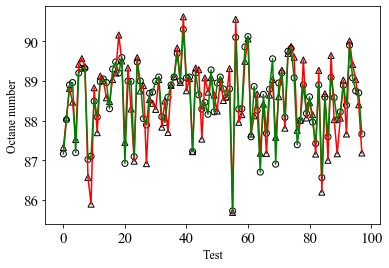

In [457]:
# 可视化
fig = plt.figure()
ax = fig.add_subplot(1,1,1)
ax.scatter(range(len(y_pred)),y_pred,c='',edgecolors='k',marker='^')
ax.scatter(range(len(y_pred)),y_test,c='',edgecolors='k',marker='o')
ax.plot(range(len(y_pred)),y_pred,c='r',label='Predicted')
ax.plot(range(len(y_pred)),y_test,c='g',label='True')
plt.xlabel('Test',fontsize=12)
plt.ylabel('Octane number',fontsize=12)
# plt.legend(frameon=False)
# plt.savefig('1.jpg')
plt.show()

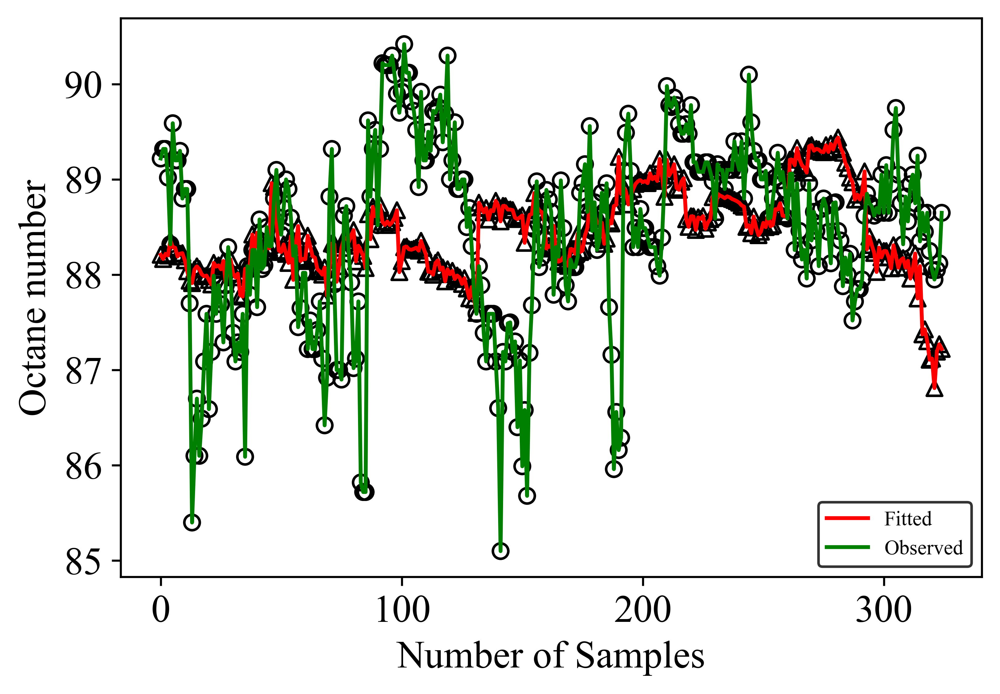

In [461]:
plt.figure(dpi=600)
plt.rcParams['font.sans-serif'] = 'Times New Roman'
# plt.rcParams['figure.dpi']=300
# plt.rcParams['savefig.dpi']=600
plt.rcParams['font.size']=15
# plt.subplot(1,2,1)
# plt.scatter(range(len(y_pred)),y_pred,c='',edgecolors='k',marker='^')
# plt.scatter(range(len(y_pred)),y_test,c='',edgecolors='k',marker='o')
# plt.plot(range(len(y_pred)),y_pred,c='r',label='Fitted')
# plt.plot(range(len(y_pred)),y_test,c='g',label='Observed')
# plt.xlabel('Number of Samples')
# plt.ylabel('Octane Number')
# # plt.xticks([0,20,30,40,50,60,70])
# plt.legend(loc='lower right',edgecolor='k',fontsize=8)
# plt.savefig('linearSVR.jpeg')
# plt.subplot(1,2,2)
plt.scatter(range(len(y)),predicted,c='',edgecolors='k',marker='^')
plt.scatter(range(len(y)),y,c='',edgecolors='k',marker='o')
plt.plot(range(len(y)),predicted,c='r',label='Fitted')
plt.plot(range(len(y)),y,c='g',label='Observed')
plt.xlabel('Number of Samples')
plt.ylabel('Octane number')
plt.legend(loc='lower right',edgecolor='k',fontsize=8)
plt.savefig('linearSVR-CV.jpeg')
plt.show()

In [27]:
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_predict,cross_val_score

In [103]:
predicted = cross_val_predict(model, pre_x, y, cv=5)

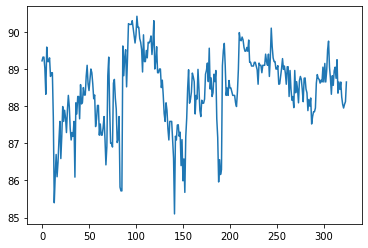

In [13]:
plt.plot(y)

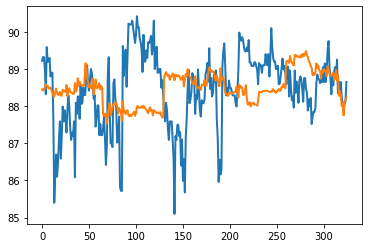

In [80]:
# fig, ax = plt.subplots()
# ax.scatter(y_ron, predicted, edgecolors=(0, 0, 0))
plt.figure()
plt.plot(range(len(y)),y,linewidth=2)
plt.plot(range(len(y)),predicted,linewidth=2)
plt.show()


# 2. 多项式SVR

In [34]:
# x_train,x_test,y_train,y_test = train_test_split(x_s,y,test_size=0.2,random_state=10)
# 建模
start_time = time()
# model = SVR(C=10,kernel='poly',epsilon=0.0001,degree=3)
model = SVR(kernel='poly',degree=3)
# 预测
y_pred = model.fit(x_train,y_train).predict(x_test)
# R2
R2 = model.score(x_test,y_test)
# mse = mean_squared_error(y_test,y_pred)
# mae = mean_absolute_error(y_test,y_pred)
mape1 = mape(y_test, y_pred)
end_time = time()
total_time = end_time-start_time
print('RMSE:{}'.format(np.sqrt(mean_squared_error(y_test, y_pred))))
print(f'R2:{R2},平均绝对误差:{mape1},运行时间:{round(total_time,6)}')

# 可视化
# fig = plt.figure()
# ax = fig.add_subplot(1,1,1)
# ax.scatter(range(len(y_pred)),y_pred,c='k',marker='o')
# ax.scatter(range(len(y_pred)),y_test,c='',edgecolors='k',marker='o')
# ax.plot(range(len(y_pred)),y_pred,c='r',label='y_pred')
# ax.plot(range(len(y_pred)),y_test,c='g',label='y_test')
# plt.xlabel('new samples')
# plt.ylabel('octane number')
# plt.legend()
# plt.savefig('2.jpg')
# plt.show()

RMSE:0.4877508394380723
R2:0.7350232205879115,平均绝对误差:0.4212010699800338,运行时间:0.032053


In [88]:
def my_custom__mape(estimator,X,y_test):
    mape = np.mean(np.abs((estimator.predict(X) - y_test) / y_test)) * 100
    return mape
s_t = time()
scores = cross_val_score(model, x_s, y, cv=10, scoring=my_custom__mape)
end_t = time()
print('耗费时间{},mape:{}'.format(end_t-s_t,scores.mean()))

耗费时间0.3011946678161621,mape:0.7522285591724753


In [67]:
scores = cross_val_score(model, x_s, y, cv=10, scoring='neg_mean_squared_error')

In [68]:
scores.mean()

-0.7140277060837187

In [463]:
predicted = cross_val_predict(model, x_s, y, cv=10)

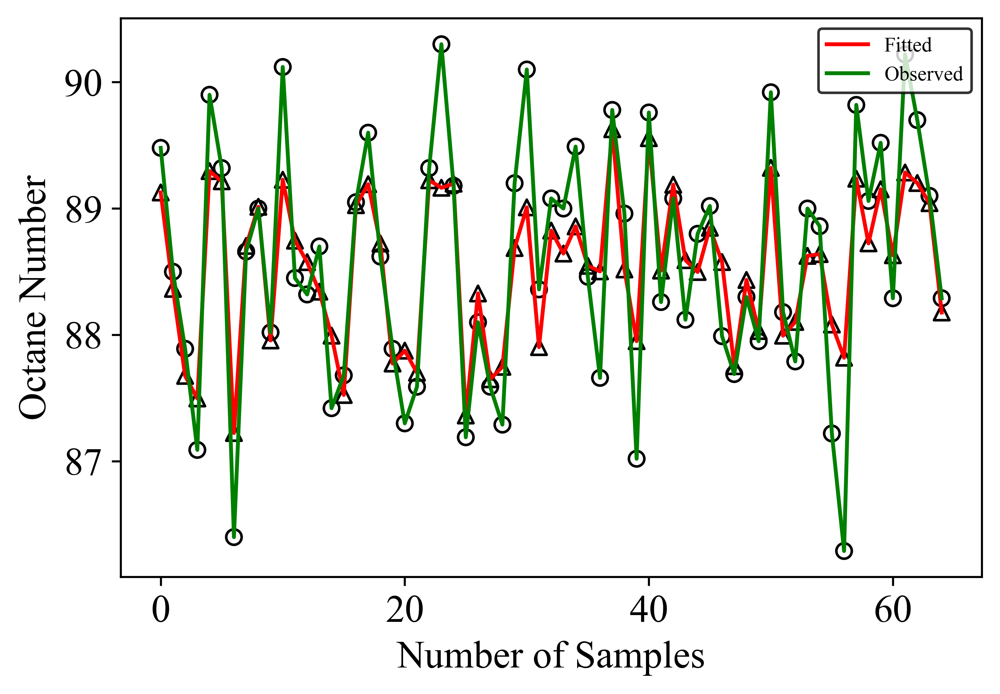

In [94]:
plt.figure(dpi=600)
plt.rcParams['font.sans-serif'] = 'Times New Roman'
# plt.rcParams['figure.dpi']=300
# plt.rcParams['savefig.dpi']=600
plt.rcParams['font.size']=15
# plt.subplot(1,2,1)
plt.scatter(range(len(y_pred)),y_pred,c='',edgecolors='k',marker='^')
plt.scatter(range(len(y_pred)),y_test,c='',edgecolors='k',marker='o')
plt.plot(range(len(y_pred)),y_pred,c='r',label='Fitted')
plt.plot(range(len(y_pred)),y_test,c='g',label='Observed')
plt.xlabel('Number of Samples')
plt.ylabel('Octane Number')
plt.legend(loc='upper right',edgecolor='k',fontsize=8)
plt.savefig('PolySVR.jpeg')
# plt.subplot(1,2,2)
# plt.scatter(range(len(y)),predicted,c='',edgecolors='k',marker='^')
# plt.scatter(range(len(y)),y,c='',edgecolors='k',marker='o')
# plt.plot(range(len(y)),predicted,c='r',label='Fitted')
# plt.plot(range(len(y)),y,c='g',label='Observed')
# plt.xlabel('Number of Samples')
# plt.ylabel('Octane number')
# plt.legend(loc='upper right',edgecolor='k',fontsize=8)
# plt.savefig('PolySVR-CV.jpeg')

plt.show()

# 3.高斯SVR

In [36]:
x_train,x_test,y_train,y_test = train_test_split(x_s,y,test_size=0.2,random_state=2525)
# 建模
start_time = time()
model_rbf = SVR(kernel='rbf',)
# model = SVR(kernel='rbf',)
# 预测
y_pred = model.fit(x_train,y_train).predict(x_test)
# R2
R2 = model.score(x_test,y_test)
mape1 = mape(y_test, y_pred)
# mse = mean_squared_error(y_test,y_pred)
# mae = mean_absolute_error(y_test,y_pred)
end_time = time()
total_time = end_time-start_time
# predicted = cross_val_predict(model, x_s, y, cv=10)
print('RMSE:{}'.format(np.sqrt(mean_squared_error(y_test, y_pred))))
print(f'R2:{R2},平均绝对误差:{mape1},运行时间:{round(total_time,6)}')
# # 可视化
# fig = plt.figure()
# ax = fig.add_subplot(1,1,1)
# ax.scatter(range(len(y_pred)),y_pred,c='k',marker='o')
# ax.scatter(range(len(y_pred)),y_test,c='',edgecolors='k',marker='o')
# ax.plot(range(len(y_pred)),y_pred,c='r',label='y_pred')
# ax.plot(range(len(y_pred)),y_test,c='g',label='y_test')
# plt.xlabel('new samples')
# plt.ylabel('octane number')
# plt.legend()
# plt.savefig('3.jpg')
# plt.show()

RMSE:0.3663767279549041
R2:0.8360309542673774,平均绝对误差:0.30662592292366053,运行时间:0.033911


In [132]:
def my_custom_mape(estimator,X,y_test):
    mape = np.mean(np.abs((estimator.predict(X) - y_test) / y_test)) * 100
    return mape
# def custom_mape(y_test,y_pred):
#     mape = np.mean(np.abs(y_pred - y_test) / (y_test)) * 100
#     return mape
# custom_score = make_scorer(custom_mape,greater_is_better=False,)
s_t = time()
scores_mape = cross_val_score(model_rbf,x_s,y,scoring=my_custom_mape,cv=10)

end_t = time()
print('耗费时间{},mape:{}'.format(end_t-s_t,scores_mape.mean()))


耗费时间0.3197183609008789,mape:0.5522435902169694


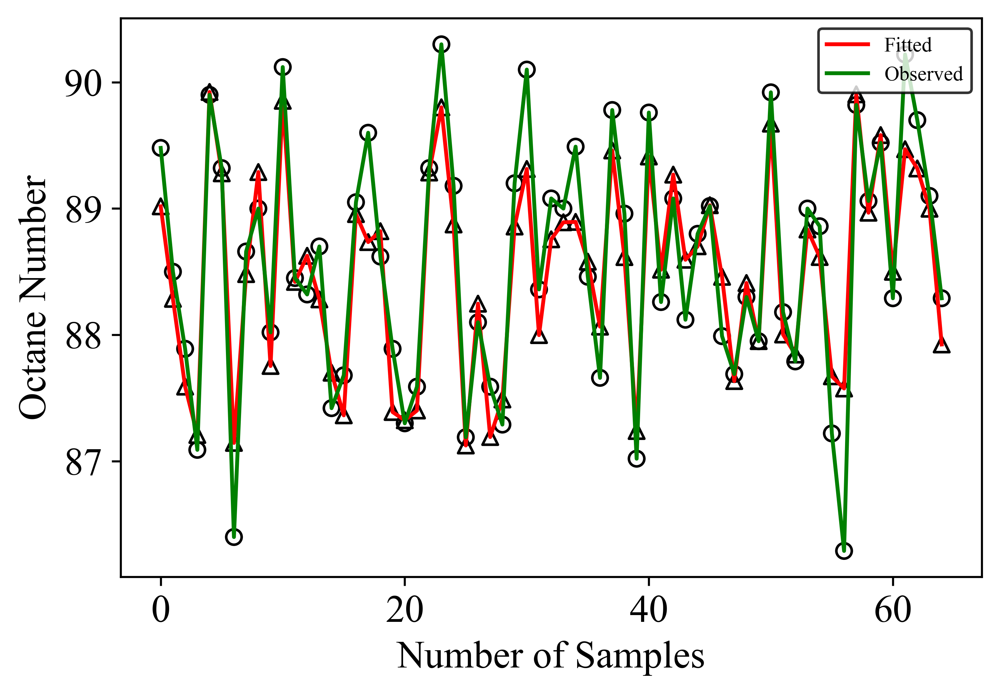

In [475]:
plt.figure(dpi=600)
plt.rcParams['font.sans-serif'] = 'Times New Roman'
# plt.rcParams['figure.dpi']=300
# plt.rcParams['savefig.dpi']=600
plt.rcParams['font.size']=15
# plt.subplot(1,2,1)
plt.scatter(range(len(y_pred)),y_pred,c='',edgecolors='k',marker='^')
plt.scatter(range(len(y_pred)),y_test,c='',edgecolors='k',marker='o')
plt.plot(range(len(y_pred)),y_pred,c='r',label='Fitted')
plt.plot(range(len(y_pred)),y_test,c='g',label='Observed')
plt.xlabel('Number of Samples')
plt.ylabel('Octane Number')
plt.legend(loc='upper right',edgecolor='k',fontsize=8)
plt.savefig('RBFSVR.jpeg')
# plt.subplot(1,2,2)
# plt.scatter(range(len(y)),predicted,c='',edgecolors='k',marker='^')
# plt.scatter(range(len(y)),y,c='',edgecolors='k',marker='o')
# plt.plot(range(len(y)),predicted,c='r',label='Fitted')
# plt.plot(range(len(y)),y,c='g',label='Observed')
# plt.xlabel('Number of Samples')
# plt.ylabel('Octane number')
# plt.legend(loc='upper right',edgecolor='k',fontsize=8)
# plt.savefig('RBFSVR-CV.jpeg')

plt.show()

# 4 PCA-SVR(poly)

# 5 PCA-SVR(rbf)

In [97]:
a=5
np.tile(a,10)

array([5, 5, 5, 5, 5, 5, 5, 5, 5, 5])

In [104]:
plt.plot?

In [98]:
pca = PCA(n_components=13)
b = pca.fit_transform(x_s)

In [101]:


# index=np.argsort(featValue) #将特征值按从大到小排序，index保留的是对应原featValue中的下标
# n_index=index[-1:-3:-1] #取最大的两维特征值在原featValue中的下标
# n_featVec=featVec[:, n_index] #取最大的两维特征值对应的特征向量组成变换矩阵
# lowData=np.dot(newData,n_featVec) #lowData=newData*n_featVec
# highData=np.dot(lowData,n_featVec.T)+meanval

In [102]:
featValue.shape

(349,)

In [107]:
sorted?

In [109]:
a = sorted(featValue,reverse=True)

In [111]:
type(a[0])

numpy.complex128

In [113]:
b = []
for i in a[:13]:
    b.append(float(i))

D:\anaconda\conda\lib\site-packages\ipykernel_launcher.py:3: ComplexWarning: Casting complex values to real discards the imaginary part
  This is separate from the ipykernel package so we can avoid doing imports until


In [117]:
len(b)

13

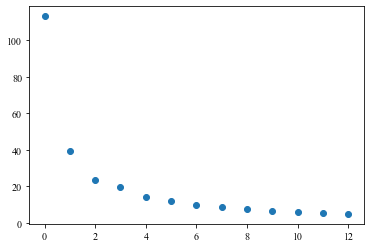

In [119]:
plt.scatter(range(len(b)),b)

In [100]:
pca.

array([[ 0.04156349,  0.01992616, -0.05713582, ..., -0.01012929,
        -0.05937663, -0.08507078],
       [-0.00915494,  0.00684885,  0.04633121, ...,  0.02762807,
         0.08963377,  0.03626871],
       [ 0.03875561, -0.00050126,  0.04857516, ...,  0.01396224,
        -0.09489534,  0.0450725 ],
       ...,
       [ 0.03674399,  0.10756687, -0.11652472, ...,  0.01856847,
         0.00294533,  0.01128742],
       [ 0.01433638, -0.04656936, -0.00151297, ...,  0.05480677,
        -0.01183767,  0.00401955],
       [ 0.08686028, -0.05358668, -0.00838189, ..., -0.0786203 ,
         0.03224344,  0.01253382]])

In [145]:
b

[113.20850386356577,
 39.11352779790255,
 23.480766463490593,
 19.716900304071892,
 14.232068363894898,
 11.9446786667302,
 9.736910086103979,
 8.371856641167136,
 7.309092008628763,
 6.5647232828039,
 6.108729970056562,
 5.153108784075517,
 4.823253007177776]

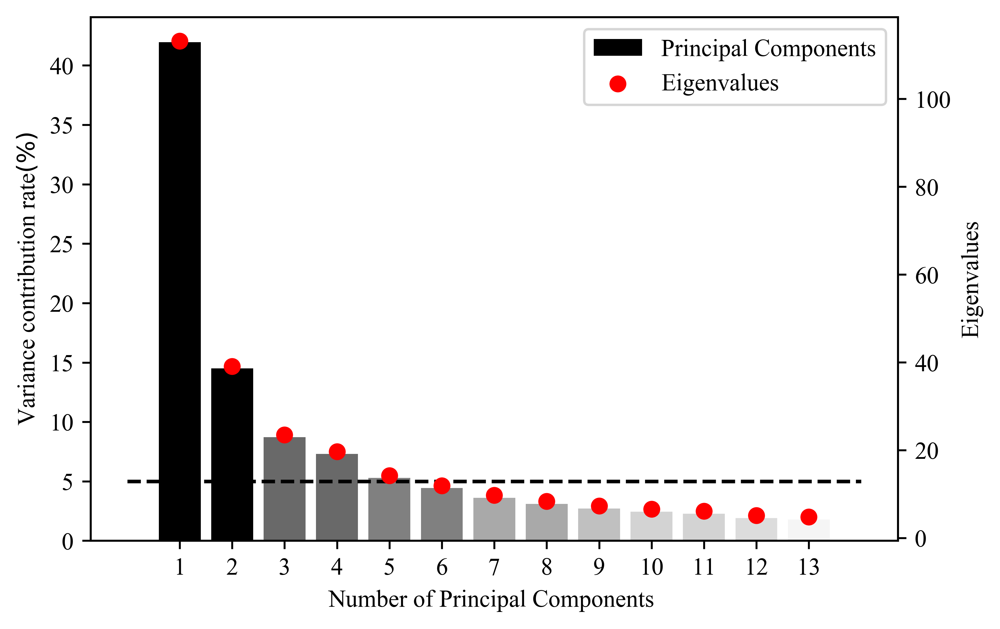

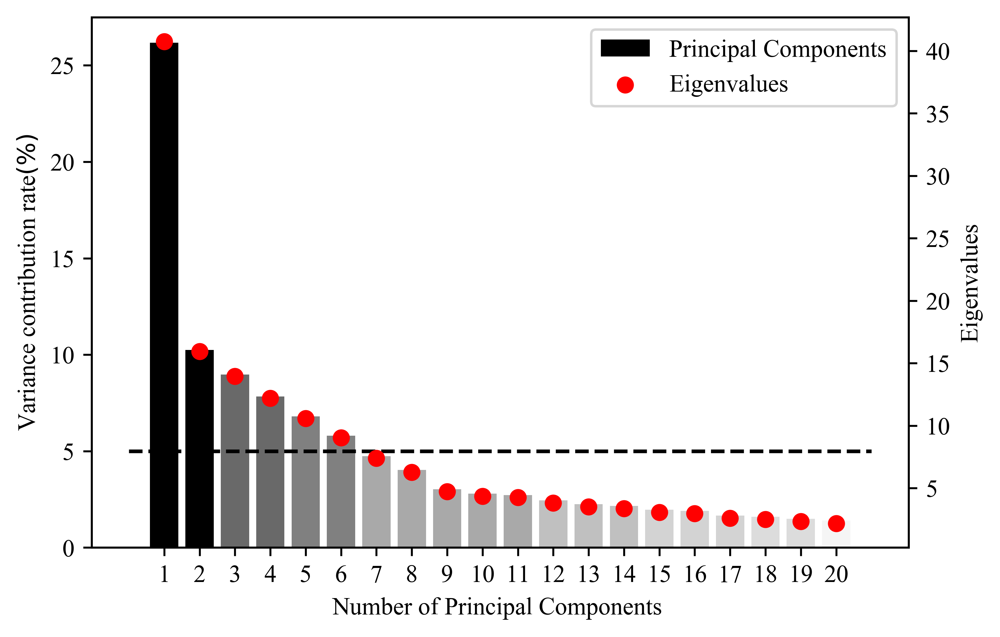

array([0.26178717, 0.10242369, 0.08966797, 0.0782744 , 0.06801367,
       0.05795661, 0.04741719, 0.04027239, 0.03025157, 0.0279294 ,
       0.02725753, 0.02440224, 0.02255826, 0.02160304, 0.01960879,
       0.01908202, 0.01655963, 0.01601826, 0.01497673, 0.01393944])

In [178]:
def pca_man(X_arr):
    meanval=np.mean(X_arr, axis=0) #计算原始数据中每一列的均值，axis=0按列取均值
    newData=X_arr-meanval #去均值化，每个feature的均值为0
    covMat=np.cov(newData,rowvar=0) #计算协方差矩阵，rowvar=0表示数据的每一列代表一个feature
    featValue, featVec=np.linalg.eig(covMat) #计算协方差矩阵的特征值和特征向量
    a = sorted(featValue,reverse=True)
    b = []
    for i in a[:14]:
        b.append(float(i))
    return b
def Pca(x,n_components,color):
    pca = PCA(n_components=13)
#     x_kpca = kpca.fit_transform(x)
    pca_transform = pca.fit_transform(x)
    explained_variance = np.var(pca_transform, axis=0)
    ev = explained_variance / np.sum(explained_variance)
    

    #--------- Bar Graph for Explained Variance Ratio ------------
    fig = plt.figure(dpi=600)
    ax1 = fig.add_subplot(111)
#     plt.figure(dpi=600)
    plt.rcParams['font.sans-serif'] = 'Times New Roman'
    p1 = plt.bar(np.arange(n_components)+1,list(ev*100),label='Principal Components',color=color)
    plt.plot(np.arange(n_components+2),np.tile(5,len(list(ev*100))+2),linestyle='dashed',c='k')
    
#     plt.xlim([-1,20])
    a = np.arange(n_components)+1
    plt.xticks(a)
    plt.xlabel('Number of Principal Components ')
    plt.ylabel('Variance contribution rate$(\%)$')
#     for x,y in zip(np.arange(20)+1,list(ev*100)):
#         plt.text(x+0.05,y+0.05,'%.2f' %y, ha='center',va='bottom')
#     plt.title('PCA')
    ax2 = ax1.twinx()
#     b = pca_man(x)
    p2 = plt.scatter(np.arange(n_components)+1,b,c='r',marker='o',label='Eigenvalues')
    ax2.set_ylabel('Eigenvalues')
    plt.legend([p1,p2],['Principal Components','Eigenvalues'])
    plt.savefig('pca.jpeg',bbox_inches='tight')
#     plt.show()
#     return 
def Kernel_Pca(x,n_components,color):
    kpca = KernelPCA(n_components=n_components,kernel='rbf')
#     x_kpca = kpca.fit_transform(x)
    kpca_transform = kpca.fit_transform(x)
    explained_variance = np.var(kpca_transform, axis=0)
    ev = explained_variance / np.sum(explained_variance)
    

    #--------- Bar Graph for Explained Variance Ratio ------------
    fig = plt.figure(dpi=600)
    plt.rcParams['font.sans-serif'] = 'Times New Roman'
    ax1 = fig.add_subplot(111)
    p1 = plt.bar(np.arange(n_components)+1,list(ev*100),label='Principal Components',color=color)
    a = np.arange(n_components)+1
    plt.xticks(a)
    plt.ylabel('Variance contribution rate$(\%)$')
    plt.xlabel('Number of Principal Components ')
    plt.plot(np.arange(n_components+2),np.tile(5,len(list(ev*100))+2),linestyle='dashed',c='k')
   
#        for x,y in zip(np.arange(20)+1,list(ev*100)):
#         plt.text(x+0.05,y+0.05,'%.2f' %y, ha='center',va='bottom')    
    ax2 = ax1.twinx()
    p2 = ax2.scatter(np.arange(n_components)+1,kpca.lambdas_,c='r',marker='o',label='Eigenvalues')
    ax2.set_ylabel('Eigenvalues')
    plt.legend([p1,p2],['Principal Components','Eigenvalues'])
    plt.savefig('kpca.jpeg', bbox_inches='tight')
    plt.show()
    return ev
colors = ['black','k','dimgray','dimgrey','grey','gray','darkgrey','darkgray','silver','lightgray','lightgrey','gainsboro','whitesmoke']
colors_1 = ['black','k','dimgray','dimgrey','grey','gray','darkgrey','darkgray','darkgray','darkgray','darkgray','silver','silver','silver','lightgray','lightgray','lightgrey','gainsboro','gainsboro','whitesmoke']
Pca(x=x_s,n_components=13,color=colors)
Kernel_Pca(x=x_s,n_components=20,color=colors_1)
# autolabel(a)

In [96]:
e

array([0.28472956, 0.11139985, 0.09752626, 0.08513418, 0.07397422,
       0.06303579, 0.05157272, 0.04380177, 0.03290274, 0.03037707,
       0.02964631, 0.0265408 , 0.02453521, 0.02349628, 0.02132726])

In [114]:
y

0.04415671656525433

In [66]:
pd.DataFrame(x_s)

,0,1,2,3,4,5,6,7,8,9,...,339,340,341,342,343,344,345,346,347,348
0,-0.632876,0.947144,0.120983,-0.199970,0.236892,0.919775,-0.157333,-0.431309,-0.358556,0.142922,...,-0.764671,0.572285,-0.043221,0.359225,-0.240525,-0.152918,2.258640,-0.147557,1.883836,0.801798
1,-0.922285,0.841725,-0.082195,0.204297,-0.341366,0.967964,1.067938,-0.406248,-0.339765,-0.820644,...,-0.835324,0.567449,-0.003718,0.337789,-0.265386,-0.152649,2.234631,-0.258063,1.864957,0.801828
2,-0.800428,1.052562,-0.082195,0.186971,-0.295044,0.948688,0.671823,-0.376175,-0.372649,0.180269,...,-1.057776,0.653591,-0.044241,0.329220,-0.275263,-0.152726,2.223530,-0.280930,1.858360,0.801725
3,-1.074605,0.736307,-0.082195,0.143657,-0.179238,0.900499,-0.318465,-0.050381,-0.335068,-0.499455,...,-0.787889,0.654701,-0.021246,0.307428,-0.300141,-0.152432,2.196630,-0.301517,1.841807,0.801814
4,-0.861356,-0.107040,-0.094679,0.259161,-0.457172,0.900850,-0.311751,-0.366150,-0.696787,-0.611498,...,-0.977170,0.686585,-0.028981,0.298616,-0.309987,-0.151888,2.184474,-0.306728,1.835420,0.801912
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320,0.637914,-0.528714,-1.198585,1.194750,-0.227876,-0.241502,-0.365462,3.142392,1.962089,5.349164,...,4.350764,1.742312,-0.404608,0.387160,0.875944,5.342685,-1.305874,-5.086777,-1.437254,-2.025872
321,0.637914,-0.528714,-1.198585,1.194750,-0.227876,-0.241502,-0.365462,2.961953,1.764787,5.267000,...,1.802358,1.819242,-0.411993,0.375983,0.869594,6.216635,-1.310461,-5.937351,-1.447907,-2.038107
322,0.637914,-0.317877,-1.198585,1.194750,-0.227876,-0.241502,-0.365462,1.272840,1.360788,1.263347,...,2.467385,1.692911,-0.406118,0.359248,0.860348,7.527560,-1.317340,-7.213213,-1.463888,-2.056459
323,0.555225,-0.317877,-1.301266,1.696041,-1.314136,-1.047403,0.762459,0.576144,0.773580,1.106487,...,3.332365,1.545238,-0.408567,0.348319,0.853919,8.401510,-1.321926,-8.063787,-1.474541,-2.068694


In [138]:

pca = PCA(n_components=349,)
x_pca_linear = pca.fit_transform(x_s)
x_inverse_l = pca.inverse_transform(x_pca_linear)

ValueError: n_components=349 must be between 0 and min(n_samples, n_features)=325 with svd_solver='full'

In [68]:
pd.DataFrame(x_pca_linear)

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,-11.214492,2.486312,-8.195757,1.215700,6.230874,0.785666,-1.664452,0.818991,0.475027,0.753210,6.331628,0.151683,-2.554522
1,-10.920233,1.137540,-9.050506,-0.010630,5.541710,2.865024,-2.005627,1.940892,-2.694820,-1.849697,5.654065,-1.365592,-0.357193
2,-10.668900,3.045785,-7.430741,0.434181,3.547227,0.959018,-0.552872,1.806599,0.166209,1.636438,5.153314,-4.077817,-2.998465
3,-10.221056,3.501872,-7.395714,0.595288,4.327130,1.830608,-0.800441,2.247748,-0.162436,-0.482838,4.720952,-3.901110,-1.808072
4,-9.804927,3.606925,-5.874557,1.399429,3.559733,0.645321,0.241666,1.346321,1.798934,0.960522,5.485189,-4.784471,-2.495059
...,...,...,...,...,...,...,...,...,...,...,...,...,...
320,15.319948,-9.424300,1.160717,18.715300,-0.097800,-6.245314,-3.940351,1.960322,-3.255311,4.371403,-1.931189,-2.221118,3.212520
321,13.256032,-9.346526,1.173209,17.793171,1.823483,-4.828029,-4.721017,3.231157,-3.092327,5.066440,-0.899149,0.981419,3.595002
322,13.106252,-9.712802,1.068013,17.327458,-0.553004,-5.311901,-3.298620,2.380797,-1.479635,7.501962,-1.405494,-2.836762,1.717875
323,14.151870,-10.147165,1.339906,18.441397,-0.519610,-6.281097,-3.761149,2.395594,-0.755730,8.084599,-0.622755,-2.920440,2.242568


In [70]:
pd.DataFrame(x_inverse_l)

,0,1,2,3,4,5,6,7,8,9,...,339,340,341,342,343,344,345,346,347,348
0,-1.267122,0.063056,0.010523,0.327853,-0.901754,0.982537,-0.682626,-0.346533,-0.397410,-0.430526,...,-1.345670,0.162675,0.329157,0.278664,-0.509606,-0.354686,2.159987,-0.227582,1.909371,0.926994
1,-1.081144,-0.005508,0.015326,0.315629,-0.885911,1.073303,-0.614640,-0.453317,-0.314339,-0.517911,...,-1.187819,0.201087,0.293789,0.223281,-0.487330,-0.469249,2.065507,-0.050294,1.830004,0.888801
2,-1.177322,0.366863,-0.051875,0.405858,-0.957035,0.573798,-0.458881,-0.876004,-0.923835,-0.966325,...,-1.452346,-0.016727,0.086718,0.184603,-0.439479,-0.163397,1.952934,-0.293691,1.731920,0.818975
3,-1.045741,0.237315,0.088142,0.273566,-0.951100,0.824745,-0.571235,-0.769539,-0.652124,-0.861385,...,-1.247891,0.039519,0.103921,0.217173,-0.422599,-0.360416,1.988974,-0.098207,1.780429,0.830792
4,-0.972438,0.455448,-0.038523,0.385126,-0.933675,0.589801,-0.536561,-0.827867,-0.818295,-0.918433,...,-1.179238,-0.035839,-0.018473,0.105079,-0.431221,-0.208290,1.813143,-0.217920,1.596423,0.767843
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320,1.281685,-0.313486,-1.447644,1.615036,-0.736010,0.120316,-0.267051,2.773880,2.056482,3.658501,...,3.058550,1.897544,-0.302093,0.544664,0.894617,5.191796,-1.282387,-5.143601,-1.361508,-2.146108
321,1.076473,-0.666018,-1.376889,1.488996,-0.573324,0.086786,-0.331828,2.799126,1.897662,3.725323,...,2.626113,1.651292,-0.044320,0.508198,0.758452,4.977546,-1.073094,-5.021789,-1.187619,-1.837960
322,0.832579,-0.382154,-1.517718,1.653760,-0.663482,-0.321374,-0.124545,2.240460,1.216913,3.039780,...,2.431121,1.535158,-0.328883,0.428182,0.785312,5.139876,-1.217536,-5.124532,-1.334361,-2.010237
323,1.016564,-0.296262,-1.736276,1.878363,-0.722458,-0.304574,-0.178765,2.364487,1.215660,3.263288,...,2.644326,1.618829,-0.338494,0.469969,0.834101,5.485241,-1.250549,-5.487471,-1.386878,-2.131048


In [293]:
# from sklearn.decomposition import PCA
x_pca_linear = PCA(n_components=13,random_state=10,).fit_transform(x_mm)
x_train,x_test,y_train,y_test = train_test_split(x_pca_linear,y,test_size=0.2,random_state=10,shuffle=False)
# 建模
st_time = time()
# model = SVR(C=4.136363636363636,kernel='rbf',gamma=26.32315789473684)
# model = SVR(kernel='rbf',C=10.2,gamma=0.01)
model = SVR(kernel='rbf')
# 预测
y_pred = model.fit(x_train,y_train).predict(x_test)
# R2
R2 = model.score(x_test,y_test)
# mse = mean_squared_error(y_test,y_pred)
# mae = mean_absolute_error(y_test,y_pred)
mape1 = mape(y_test, y_pred)
end_time = time()
total_time = end_time-st_time
print('RMSE:{}'.format(np.sqrt(mean_squared_error(y_test, y_pred))))
print(f'R2:{R2},平均绝对误差:{mape1},运行时间{total_time}')

# 可视化
# fig = plt.figure()
# ax = fig.add_subplot(1,1,1)
# ax.scatter(range(len(y_pred)),y_pred,c='k',marker='o')
# ax.scatter(range(len(y_pred)),y_test,c='',edgecolors='k',marker='o')
# ax.plot(range(len(y_pred)),y_pred,c='r',label='y_pred')
# ax.plot(range(len(y_pred)),y_test,c='g',label='y_test')
# plt.xlabel('new samples')
# plt.ylabel('octane number')
# plt.legend()
# plt.savefig('5.jpg')
# plt.show()

RMSE:0.3862853162483474
R2:0.20855349522388664,平均绝对误差:0.3388628144253721,运行时间0.003988504409790039


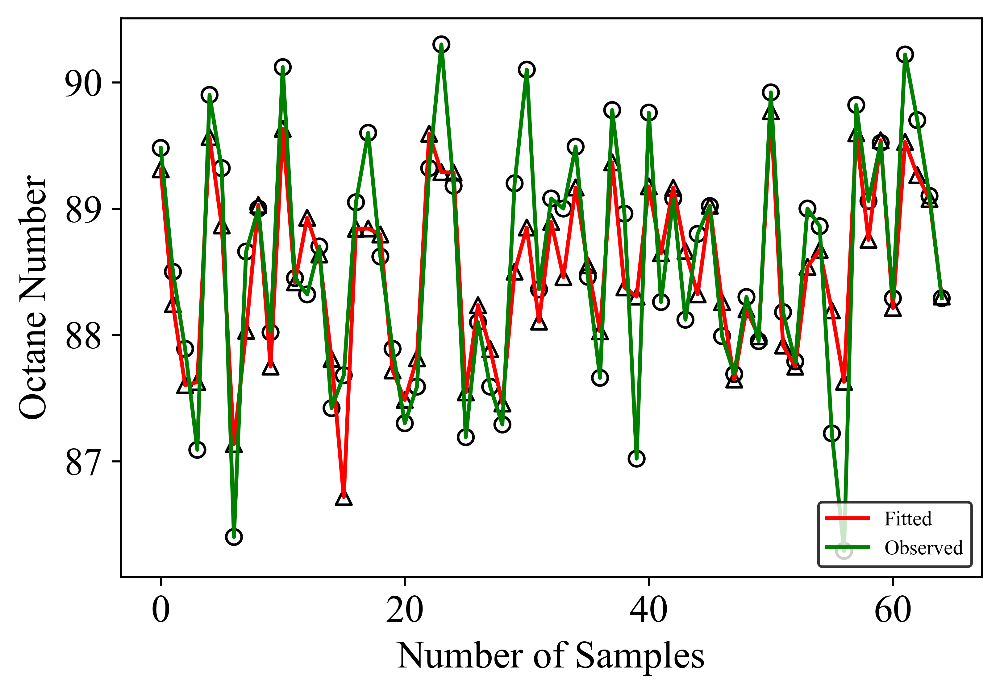

In [488]:
plt.figure(dpi=600)
plt.rcParams['font.sans-serif'] = 'Times New Roman'
# plt.rcParams['figure.dpi']=300
# plt.rcParams['savefig.dpi']=600
plt.rcParams['font.size']=15
# plt.subplot(1,2,1)
plt.scatter(range(len(y_pred)),y_pred,c='',edgecolors='k',marker='^')
plt.scatter(range(len(y_pred)),y_test,c='',edgecolors='k',marker='o')
plt.plot(range(len(y_pred)),y_pred,c='r',label='Fitted')
plt.plot(range(len(y_pred)),y_test,c='g',label='Observed')
plt.xlabel('Number of Samples')
plt.ylabel('Octane Number')
plt.legend(loc='lower right',edgecolor='k',fontsize=8)
plt.savefig('PCA-SVR(RBF).jpeg')
plt.show()

In [79]:
pca= PCA(n_components=13,random_state=10,)
m = pca.fit(dataset)


In [80]:
pca.explained_variance_ratio_

array([0.42293179, 0.13397062, 0.07825044, 0.05898861, 0.04016523,
       0.0267855 , 0.0227245 , 0.01965716, 0.01587861, 0.01464758,
       0.0142339 , 0.01213032, 0.01023123])

# 6 rbf-KPCA-SVR(poly)

In [35]:
# 1.多项式核
x_pca_rbf = KernelPCA(n_components=20,random_state=10,kernel='rbf',).fit_transform(x_s)
x_train,x_test,y_train,y_test = train_test_split(x_pca_rbf,y,test_size=0.2,random_state=10)
# 建模
# model = SVR(C=10,kernel='poly',epsilon=0.0001,degree=3)
model = SVR(kernel='poly',)
# 预测
y_pred = model.fit(x_train,y_train).predict(x_test)
# R2
R2 = model.score(x_test,y_test)
mape1 = mape(y_test, y_pred)
# mse = mean_squared_error(y_test,y_pred)
# mae = mean_absolute_error(y_test,y_pred)
print('RMSE:{}'.format(np.sqrt(mean_squared_error(y_test, y_pred))))
print(f'R2:{R2},平均绝对误差:{mape1},运行时间{total_time}')
# 可视化
# fig = plt.figure()
# ax = fig.add_subplot(1,1,1)
# ax.scatter(range(len(y_pred)),y_pred,c='k',marker='o')
# ax.scatter(range(len(y_pred)),y_test,c='',edgecolors='k',marker='o')
# ax.plot(range(len(y_pred)),y_pred,c='r',label='y_pred')
# ax.plot(range(len(y_pred)),y_test,c='g',label='y_test')
# plt.xlabel('new samples')
# plt.ylabel('octane number')
# plt.legend()
# plt.show()
# plt.savefig('6.jpg')

RMSE:0.4637912661983424
R2:0.7604165037225128,平均绝对误差:0.3898129211164736,运行时间0.004985332489013672


# 7.rbf-KPCA-SVR(rbf)

In [11]:
train_test_split?

In [6]:
kpca = KernelPCA(n_components=20,kernel='rbf')
x_kpca_rbf = kpca.fit_transform(x_s.T)

In [10]:
components = kpca.alphas_

In [90]:
components

array([[ 0.01580461,  0.03113386, -0.04162745, ...,  0.04085157,
        -0.0276267 , -0.04780307],
       [-0.00374393,  0.01500496, -0.01160644, ...,  0.01984396,
         0.03869353, -0.06285333],
       [-0.06212409, -0.04562138, -0.04479171, ..., -0.07305774,
        -0.03146278,  0.00502127],
       ...,
       [-0.02583766, -0.00158197, -0.01252832, ..., -0.03587167,
        -0.00778781, -0.1061874 ],
       [-0.06914245, -0.09079514, -0.01059375, ...,  0.04897251,
        -0.08797856, -0.05881133],
       [-0.0911701 , -0.0835484 , -0.05729813, ...,  0.02917945,
        -0.01791632, -0.00733264]])

In [183]:
np.where(components.T[0]>0.1)[0].tolist()

[23, 99, 102, 105, 177, 252, 313, 314, 315, 317, 322, 343]

In [186]:
plt.bar?

In [191]:
np.where?

In [193]:
index

[23, 99, 102, 105, 177, 252, 313, 314, 315, 317, 322, 343]

In [201]:
np.where(components.T[0]<-0.095)

(array([107, 175, 204, 234, 259, 260, 261, 297, 298], dtype=int64),)

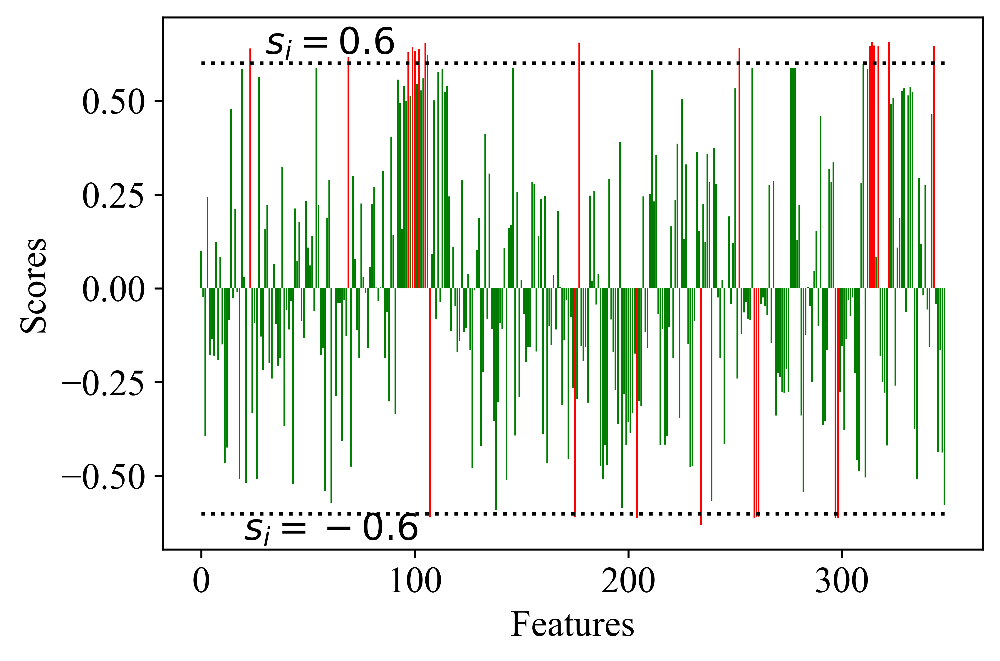

In [239]:
plt.figure(dpi=600)
plt.rcParams['font.sans-serif'] = 'Times New Roman'
plt.rcParams['font.size']=15
a = len(b.T[0]) 
color = ['g'] * a
index = np.where((b.T[0]>=0.6) + (b.T[0]<=-0.6))[0].tolist()
for i in index:
    color[i] = 'r'
plt.bar(range(a),b.T[0],color=color,)
plt.plot(range(a),np.tile(0.6,a),linestyle='dotted',color='k')
plt.plot(range(a),np.tile(-0.6,a),linestyle='dotted',color='k')
plt.text(30,0.625,'$s_i=0.6$')
plt.text(20,-0.67,'$s_i=-0.6$')
plt.ylabel('Scores')
plt.xlabel('Features')
plt.savefig('scores.jpeg',bbox_inches='tight')
plt.show()

In [91]:
lam = kpca.lambdas_

array([40.06362115, 16.74678939, 11.11411951, 10.88067853,  8.26356212,
        6.30362621,  5.94838781,  5.236684  ,  4.74274484,  4.52205217,
        4.31132311,  4.14420491,  3.84008437,  3.49590088,  3.33252599,
        3.12953139,  2.95179496,  2.88427859,  2.6565542 ,  2.4370336 ])

In [93]:
40.06362115*0.01580461

0.6331899074635016

In [205]:
b = np.multiply(np.sqrt(lam),components)

In [206]:
b.shape

(349, 20)

In [97]:
pd.DataFrame(b).to_excel('载荷矩阵.xlsx',index=None)

In [84]:
pp = []
for i in lam:
    for j in components.T:
        p = np.sqrt(i)*j
        pp.append(p)

In [86]:
components.shape

(349, 20)

In [83]:
len(p)

349

In [85]:
len(pp)

400

In [79]:
pp[0]

array([ 0.10003659,  0.19706436, -0.2634844 ,  0.16996527, -0.0265364 ,
        0.26834615, -0.07216934,  0.63065041, -0.53010401,  0.07894873,
        0.36607823, -0.05858766, -0.1787298 , -0.06946692, -0.0087494 ,
       -0.24905232,  0.0780164 ,  0.25857343, -0.17486552, -0.30257349])

In [65]:
ppp = []
for i in pp:
    ppp.append(i.tolist())

In [74]:
len(ppp)

6980

In [73]:
np.array(ppp).shape

(6980, 20)

ValueError: cannot reshape array of size 139600 into shape (349,20)

In [35]:
349*20

6980

In [39]:
b=np.array(pp)

In [33]:
len(pp[0])

349

In [132]:
pd.DataFrame(x_kpca).to_csv('主成分载荷.csv',index=None)

In [135]:
minmax_scale?

In [137]:
pd.DataFrame(minmax_scale(x_kpca,feature_range=(-1,1))).to_csv('主成分载荷标准化后.csv',index=None)

In [328]:
x_kpca = pd.DataFrame(minmax_scale(x_kpca,feature_range=(-1,1)))

In [232]:
pd.DataFrame(x_pca_rbf)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,-0.283448,-0.174967,-0.273086,0.197569,-0.202437,-0.052791,0.047837,0.360246,-0.122016,-0.020315,-0.060882,0.029086,0.174429,-0.044407,-0.001443,-0.132941,0.027043,0.160992,0.183488,-0.134246
1,-0.261756,-0.145135,-0.275642,0.199380,-0.181569,-0.028609,0.064499,0.382463,-0.063338,-0.011403,-0.072440,-0.049105,0.099089,0.005609,0.048733,-0.163978,-0.054261,0.167434,0.190526,-0.096849
2,-0.299606,-0.176740,-0.256695,0.154174,-0.153224,-0.045152,0.042503,0.340790,-0.119277,-0.003052,-0.073003,0.047666,0.146006,-0.017506,0.066308,-0.158869,-0.039514,0.161492,0.181035,-0.226113
3,-0.311571,-0.196029,-0.268015,0.167201,-0.177334,-0.063552,0.043459,0.379129,-0.092638,0.004020,-0.117579,0.090828,0.114043,-0.040621,0.066345,-0.211994,-0.084674,0.149719,0.159121,-0.150204
4,-0.289201,-0.171820,-0.205032,0.126145,-0.152190,-0.047395,0.027661,0.326087,-0.139374,-0.018144,-0.060652,0.176310,0.078660,-0.054129,0.051848,-0.190774,-0.062026,0.130830,0.158055,-0.224076
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320,0.189124,0.108648,-0.005766,0.079327,-0.324123,0.379883,0.201681,-0.127563,-0.126788,0.407307,0.196273,-0.021373,0.011339,0.033134,-0.039014,-0.120050,0.008369,-0.002717,-0.026874,0.000330
321,0.198862,0.122812,-0.008111,0.082808,-0.340399,0.405125,0.219981,-0.144996,-0.148936,0.462029,0.229474,-0.020955,0.019606,0.029753,-0.066782,-0.152771,0.004836,0.015695,-0.057143,0.015444
322,0.200819,0.126166,-0.014466,0.069635,-0.335919,0.400100,0.211826,-0.141644,-0.156010,0.500425,0.245330,-0.003595,0.023770,0.057066,-0.074142,-0.152036,0.007406,0.025454,-0.069669,0.005979
323,0.189755,0.118017,-0.007870,0.079005,-0.334516,0.391895,0.214345,-0.134185,-0.150722,0.507451,0.252084,-0.009975,0.022621,0.051022,-0.065437,-0.145820,0.015513,0.019295,-0.057900,0.001206


In [236]:
pd.DataFrame(x_pca_rbf)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,-0.283448,-0.174967,-0.273086,0.197569,-0.202437,-0.052791,0.047837,0.360246,-0.122016,-0.020315,-0.060882,0.029086,0.174429,-0.044407,-0.001443,-0.132941,0.027043,0.160992,0.183488,-0.134246
1,-0.261756,-0.145135,-0.275642,0.199380,-0.181569,-0.028609,0.064499,0.382463,-0.063338,-0.011403,-0.072440,-0.049105,0.099089,0.005609,0.048733,-0.163978,-0.054261,0.167434,0.190526,-0.096849
2,-0.299606,-0.176740,-0.256695,0.154174,-0.153224,-0.045152,0.042503,0.340790,-0.119277,-0.003052,-0.073003,0.047666,0.146006,-0.017506,0.066308,-0.158869,-0.039514,0.161492,0.181035,-0.226113
3,-0.311571,-0.196029,-0.268015,0.167201,-0.177334,-0.063552,0.043459,0.379129,-0.092638,0.004020,-0.117579,0.090828,0.114043,-0.040621,0.066345,-0.211994,-0.084674,0.149719,0.159121,-0.150204
4,-0.289201,-0.171820,-0.205032,0.126145,-0.152190,-0.047395,0.027661,0.326087,-0.139374,-0.018144,-0.060652,0.176310,0.078660,-0.054129,0.051848,-0.190774,-0.062026,0.130830,0.158055,-0.224076
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320,0.189124,0.108648,-0.005766,0.079327,-0.324123,0.379883,0.201681,-0.127563,-0.126788,0.407307,0.196273,-0.021373,0.011339,0.033134,-0.039014,-0.120050,0.008369,-0.002717,-0.026874,0.000330
321,0.198862,0.122812,-0.008111,0.082808,-0.340399,0.405125,0.219981,-0.144996,-0.148936,0.462029,0.229474,-0.020955,0.019606,0.029753,-0.066782,-0.152771,0.004836,0.015695,-0.057143,0.015444
322,0.200819,0.126166,-0.014466,0.069635,-0.335919,0.400100,0.211826,-0.141644,-0.156010,0.500425,0.245330,-0.003595,0.023770,0.057066,-0.074142,-0.152036,0.007406,0.025454,-0.069669,0.005979
323,0.189755,0.118017,-0.007870,0.079005,-0.334516,0.391895,0.214345,-0.134185,-0.150722,0.507451,0.252084,-0.009975,0.022621,0.051022,-0.065437,-0.145820,0.015513,0.019295,-0.057900,0.001206


In [396]:
y_sul

0       3.2
1       3.2
2       3.2
3       3.2
4       3.2
       ... 
320     3.2
321     3.2
322     3.2
323     3.6
324    11.8
Name: y_sul, Length: 325, dtype: float64

In [349]:
trian_sul,test_sul = train_test_split(y_sul,test_size=0.2,random_state=2525,)

In [400]:
test_sul.shape

(65,)

In [403]:
test_sul

166    3.2
65     3.2
66     3.2
323    3.6
298    4.4
      ... 
259    4.6
136    3.2
246    3.2
290    3.2
247    4.7
Name: y_sul, Length: 65, dtype: float64

In [28]:
start_time = time()
x_pca_rbf = KernelPCA(n_components=20,kernel='rbf',).fit_transform(x_s)
x_train,x_test,y_train,y_test = train_test_split(x_pca_rbf,y,test_size=0.4,random_state=2525,)
# x_train0 = x_pca_rbf[:200,:]
# x_train1 = x_pca_rbf[300:,:]
# x_train = np.vstack((x_train0,x_train1))
# x_train = x_kpca_rbf[:260,:]
# y_train = y[:260]
# x_test = x_pca_rbf[260:,:]

# y_test = y[260:]
# 建模
# model = SVR(kernel='rbf')
# model = SVR(kernel='rbf',C=12,gamma=5)
model = SVR(kernel='rbf',C=1000,gamma=0.035)
# model = SVR(kernel='rbf',C=900,gamma=800)
# 预测
y_pred_train = model.fit(x_train,y_train).predict(x_train)
y_pred_test = model.fit(x_train,y_train).predict(x_test)

# R2
R2_train = model.score(x_train,y_train)
R2_test = model.score(x_test,y_test)

mape1 = mape(y_test, y_pred_test)
# mse = mean_squared_error(y_test,y_pred)
# mae = mean_absolute_error(y_test,y_pred)
end_time = time()
total_time = end_time-start_time
print(R2_train)
print('RMSE:{}'.format(np.sqrt(mean_squared_error(y_test, y_pred_test))))
print(f'R2:{R2_test},平均绝对误差:{mape1},运行时间{total_time}')

0.7400940116925128
RMSE:0.43797694287986316
R2:0.7839818359040844,平均绝对误差:0.3652971881022161,运行时间0.04488015174865723



 mu = 88.50 and sigma = 0.87



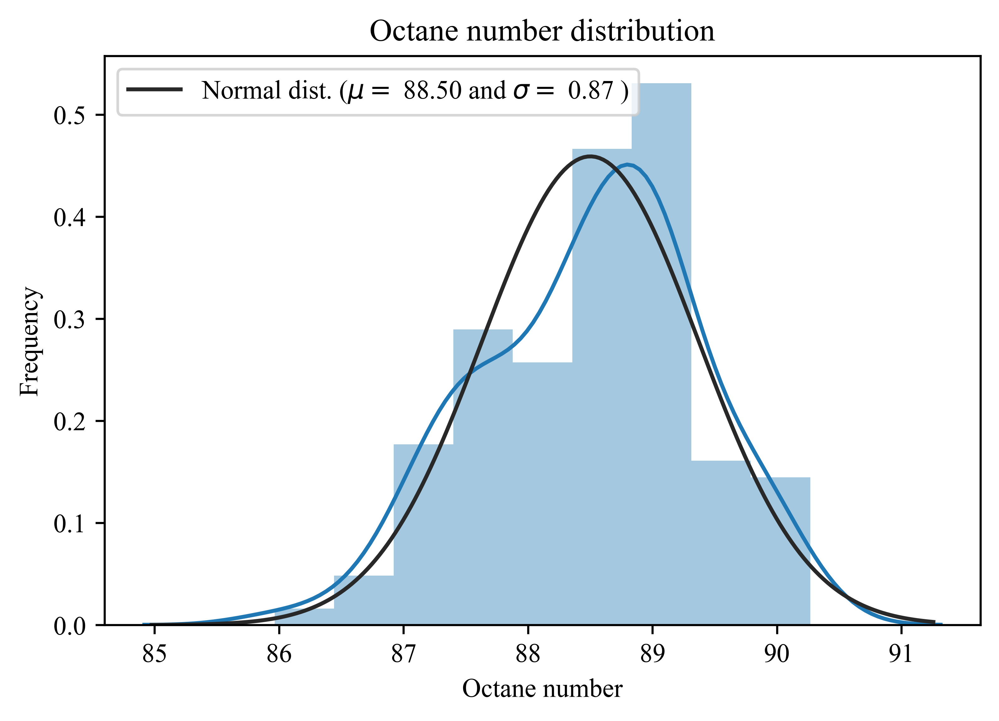

In [32]:
# 产品辛烷值分布特征
from scipy.stats import norm, skew
import seaborn as sns
fig = plt.figure(dpi=600)
plt.rcParams['font.sans-serif'] = 'Times New Roman'
sns.distplot(y_pred_test, fit=norm)

# 获得均值和方差
(mu, sigma) = norm.fit(y_pred_test)
print('\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

# 画出数据分布图
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
           loc='upper left')
plt.ylabel('Frequency')
plt.xlabel("Octane number")

# 设置标题
plt.title('Octane number distribution')
plt.savefig('octane-distribution.jpeg',bbox_inches='tight')

In [574]:
np.mean(y_pred_test)

88.95948984442356

In [539]:
plt.plot?

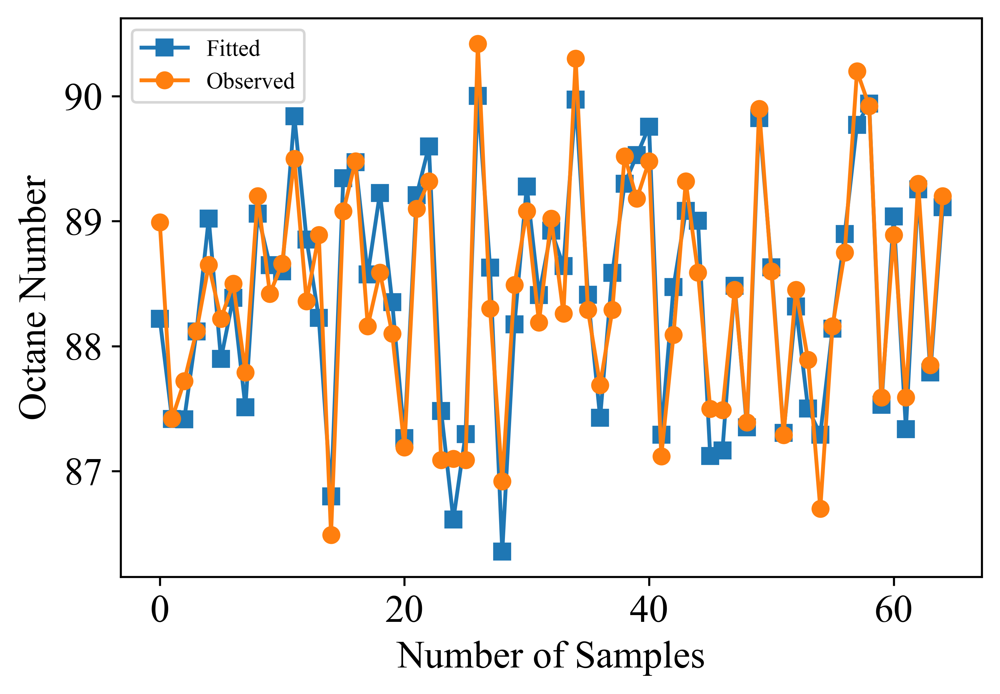

In [545]:
# plt.figure(dpi=600)
plt.figure(dpi=600)
plt.rcParams['font.sans-serif'] = 'Times New Roman'
plt.rcParams['font.size']=15
plt.plot(range(len(y_pred_test)),y_pred_test,'s-',label='Fitted')
plt.plot(range(len(y_pred_test)),y_test,'o-',label='Observed')
plt.xlabel('Number of Samples')
plt.ylabel('Octane Number')
plt.legend(fontsize=9)
plt.savefig('kpca-pso-fitted.jpeg',bbox_inches='tight')
plt.show()

In [546]:
np.mean(y_pred_train)

88.4774986080488

In [547]:
np.mean(y_pred_test)

88.42297089008562

In [548]:
np.mean(y_test)

88.41369230769232

In [339]:
ron_hat = y_test-y_pred

In [340]:
pd.DataFrame(ron_hat).to_csv('ron_hat.csv',index=None)

In [352]:
y_ron_p = np.array(df5['x2'])

In [354]:
train_y_ron_p,test_y_ron_p = train_test_split(y_ron_p,test_size=0.2,random_state=2525,)
train_ron, test_ron = train_test_split(y_ron_p,test_size=0.2,random_state=2525,)

In [355]:
ron_loss = test_y_ron_p-y_pred

In [356]:
ron_loss_pn = test_y_ron_p-y_test

In [372]:
a = pd.DataFrame(ron_loss_pn,columns=['原材料与产品辛烷值损失'])

In [421]:
a

,原材料与产品辛烷值损失
0,0.61
1,1.28
2,1.28
3,1.28
4,1.15
...,...
60,1.21
61,1.51
62,1.30
63,1.25


In [374]:
b = pd.DataFrame(ron_loss,columns=['原材料与预测辛烷值损失'])

In [404]:
c = pd.DataFrame(test_sul,columns=['产品硫含量'])

In [422]:
c = pd.DataFrame(np.array(test_sul))

In [423]:
c

,0
0,3.2
1,3.2
2,3.2
3,3.6
4,4.4
...,...
60,4.6
61,3.2
62,3.2
63,3.2


In [415]:
pd.concat((a,b),axis=1).to_csv('损失对比.csv',index=None,encoding='gbk')

In [416]:
dd = pd.read_csv('损失对比.csv',encoding='gbk')

In [424]:
dd['硫含量'] =c

In [426]:
dd.to_csv('损失对比.csv',index=None,encoding='gbk')

In [627]:
kpca.alphas_

array([[ 0.01580461,  0.03113386, -0.04162745, ...,  0.04085157,
        -0.0276267 , -0.04780307],
       [-0.00374393,  0.01500496, -0.01160644, ...,  0.01984396,
         0.03869353, -0.06285333],
       [-0.06212409, -0.04562138, -0.04479171, ..., -0.07305774,
        -0.03146278,  0.00502127],
       ...,
       [-0.02583766, -0.00158197, -0.01252832, ..., -0.03587167,
        -0.00778781, -0.1061874 ],
       [-0.06914245, -0.09079514, -0.01059375, ...,  0.04897251,
        -0.08797856, -0.05881133],
       [-0.0911701 , -0.0835484 , -0.05729813, ...,  0.02917945,
        -0.01791632, -0.00733264]])

In [628]:
al = kpca.alphas_

In [633]:
al.shape

(349, 20)

In [629]:
alT = al.T

In [632]:
alT.shape

(20, 349)

In [631]:
for i in alT:
    print(np.sum(i**2))

1.0
0.9999999999999998
1.0
1.0
0.9999999999999996
1.0
1.0
1.0
0.9999999999999999
1.0000000000000002
1.0
1.0000000000000004
0.9999999999999998
1.0
1.0
1.0
0.9999999999999998
1.0
1.0000000000000002
1.0


In [634]:
bl = kpca.lambdas_

In [638]:
p = []
for i in bl:
    for j in alT:
        p.append(np.sqrt(i)*j)

In [640]:
len(p)

400

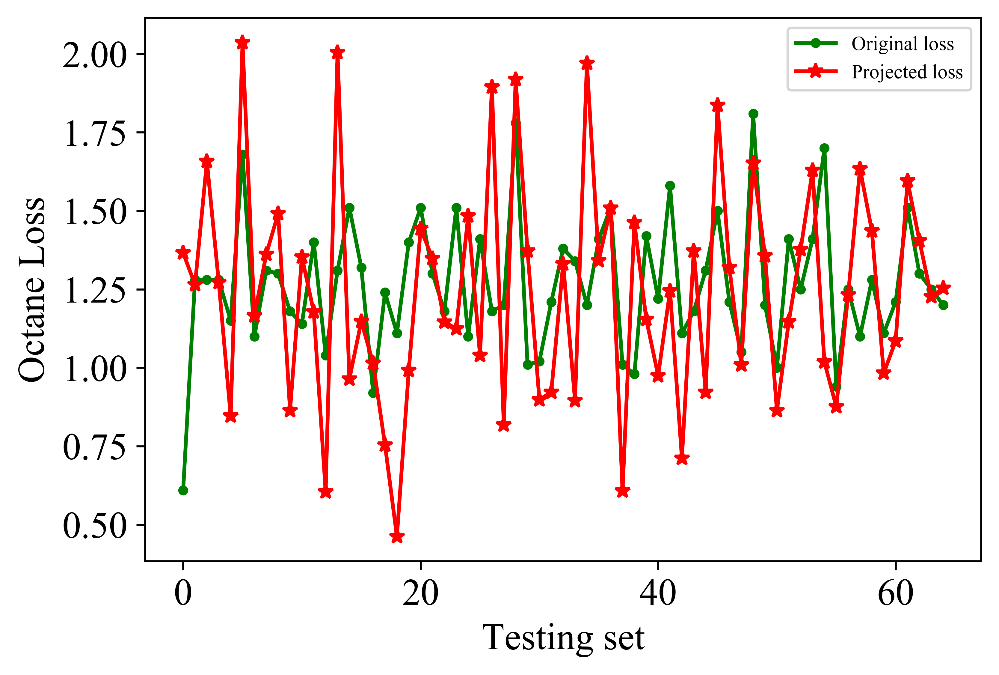

In [521]:
plt.figure(dpi=600)
plt.rcParams['font.sans-serif'] = 'Times New Roman'
plt.rcParams['font.size']=15
plt.plot(range(len(b)),a,'.-g',label='Original loss')
plt.plot(range(len(b)),b,'*-r',label='Projected loss')
# plt.plot(range(len(c)),c,'k',linestyle='-',label='Sulfur content')
# plt.plot(np.arange(b+1),np.tile(0.8,66),linestyle='dashed',c='k')
plt.xlabel('Testing set')
plt.ylabel('Octane Loss')
# plt.grid()
plt.legend(fontsize=8)
plt.savefig('octane-loss.jpeg',bbox_inches='tight')
plt.show()

In [438]:
sub = (ron_loss_pn-ron_loss)/ron_loss_pn

In [475]:
np.tile(0.3,65)

array([0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3,
       0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3,
       0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3,
       0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3,
       0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3, 0.3])

In [486]:
plt.text?

In [516]:
from matplotlib.ticker import FuncFormatter

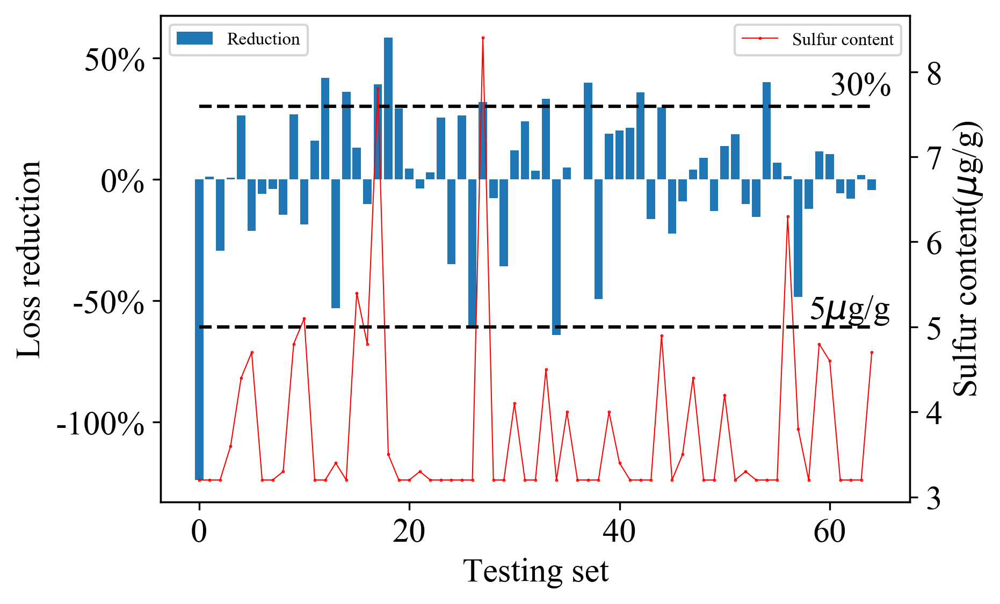

In [626]:
fig = plt.figure(dpi= 300)

plt.rcParams['font.sans-serif'] = 'Times New Roman'
plt.rcParams['font.size']=15
ax1 = fig.add_subplot(111)
plt.bar(range(len(sub)),sub,label='Reduction')
plt.plot(range(len(sub)),np.tile(0.3,65),linestyle='dashed',c='k')
plt.text(60,0.35,'30%')
plt.legend(loc='upper left',fontsize=8)
plt.ylabel('Loss reduction')
def to_percent(temp, position):
    return '%1.0f'%(100*temp) + '%'
# plt.yticks([$-125\%$,-100%,-75%,-50%,-25%,0.0%,25%,50%])
# plt.yticks(['-125%','-100%','-75%','-50%','-25%','0.0%','25%','50%'])
plt.gca().yaxis.set_major_formatter(FuncFormatter(to_percent))
plt.xlabel('Testing set')


# ax1.plot(df['yearmonth'], df['new'],)
# ax1.set_ylabel('每月新增投资者数目（单位：万户）',fontdict={'weight': 'normal', 'size': 15})
# ax1.set_title("投资者用户数统计",fontdict={'weight': 'normal', 'size': 15})

ax2 = ax1.twinx()  # this is the important function

ax2.plot(range(len(test_sul)),test_sul,'.-r',linewidth=0.5,markersize=0.8,label='Sulfur content')
plt.plot(range(len(sub)),np.tile(5,65),linestyle='dashed',c='k')
plt.text(58,5.1,'5$\mu$g/g')

plt.legend(fontsize=8)
ax2.set_ylabel('Sulfur content($\mu$g/g)')
#参数rotation设置坐标旋转角度，参数fontdict设置字体和字体大小
# ax1.set_xticklabels(df['yearmonth'],rotation=90,fontdict={'weight': 'normal', 'size': 15})
# plt.plot(range(len(b)),a,,label='Original loss')
# plt.plot(range(len(b)),b,'*',label='Projected loss')
# plt.plot(range(len(sub)),'^-b',np.array(c))
# plt.fill_between(range(len(sub)), sub, 0, where=sub >= 0, facecolor='green', interpolate=True, alpha=0.7)
# plt.fill_between(range(len(sub)), sub, 0, where=sub <= 0, facecolor='red', interpolate=True, alpha=0.7)
# plt.savefig('percentage-reduction.jpeg',bbox_inches='tight')
plt.show()

In [310]:
np.mean(y_pred)

88.45881275407153

$R^2$

In [145]:
0.9665**2

0.93412225

In [96]:
pd.DataFrame(y_train).to_csv('y_train.csv',index=None)
pd.DataFrame(y_pred_train).to_csv('y_pred.csv',index=None)

In [122]:
plt.style.available

['bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'seaborn-bright',
 'seaborn-colorblind',
 'seaborn-dark-palette',
 'seaborn-dark',
 'seaborn-darkgrid',
 'seaborn-deep',
 'seaborn-muted',
 'seaborn-notebook',
 'seaborn-paper',
 'seaborn-pastel',
 'seaborn-poster',
 'seaborn-talk',
 'seaborn-ticks',
 'seaborn-white',
 'seaborn-whitegrid',
 'seaborn',
 'Solarize_Light2',
 'tableau-colorblind10',
 '_classic_test']

In [207]:
0.96625**2

0.9336390625000001

In [205]:
plt.legend?

In [213]:
plt.title?

$R^2$

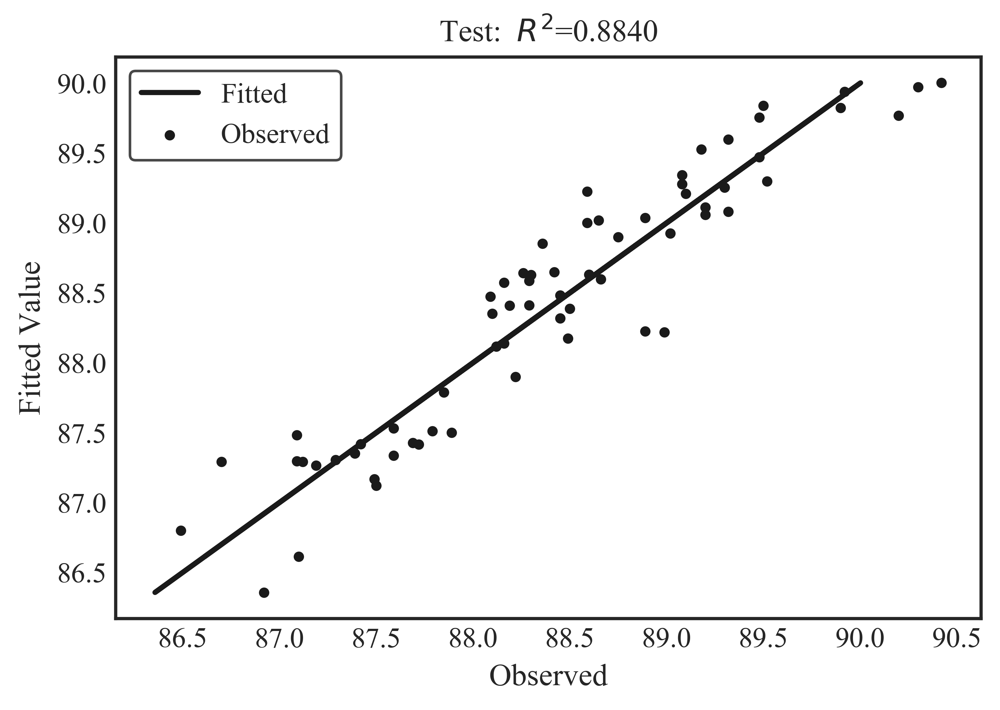

In [340]:
plt.style.use('seaborn-ticks')
plt.figure(dpi=600)
# plt.rc('font',family='Times New Roman')
plt.rcParams['font.sans-serif'] = 'Times New Roman'
plt.rcParams['font.size']=15
plt.rcParams['xtick.direction'] = 'in'#将x周的刻度线方向设置向内
plt.rcParams['ytick.direction'] = 'in'#将y轴的刻度方向设置向内
# plt.subplot(1,2,1)
# plt.plot(y_pred_train,y_pred_train,c='g',linewidth=2,label='Fitted')
# plt.scatter(y_train,y_pred_train,c='k',marker='.',label='Observed')
# # plt.plot(range(len(y_train)),y_train,c='k')
# plt.title('Training:  $R^2$=0.9790')
# plt.ylabel('Fitted Value')
# plt.xlabel('Observed')
# plt.legend(frameon=True,edgecolor='k')


plt.plot(y_pred_test,y_pred_test,c='k',linewidth=2,label='Fitted')
plt.scatter(y_test,y_pred_test,c='k',marker='.',label='Observed')
plt.title('Test:  $R^2$=0.8840')
plt.ylabel('Fitted Value')
plt.xlabel('Observed')
plt.legend(frameon=True,edgecolor='k')
plt.savefig('pso-kpca-svr_test.jpeg')
# plt.savefig('pso-kpca-svr_train.jpeg')
plt.show()


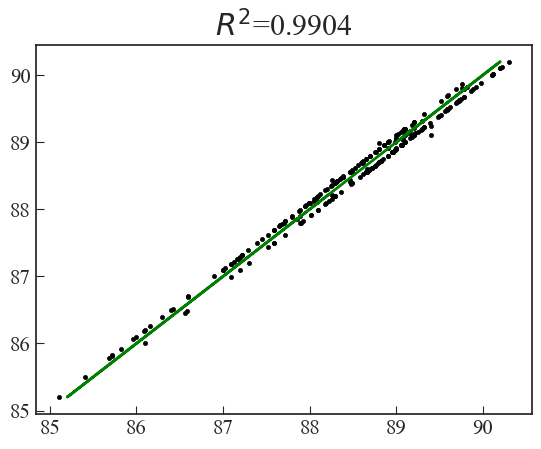

In [168]:
plt.style.use('seaborn-ticks')
plt.rcParams['font.sans-serif'] = 'Times New Roman'
plt.rcParams['font.size']=15
plt.rcParams['xtick.direction'] = 'in'#将x周的刻度线方向设置向内
plt.rcParams['ytick.direction'] = 'in'#将y轴的刻度方向设置向内
plt.scatter(y_train,y_pred_train,c='k',marker='.',)
# plt.plot(range(len(y_train)),y_train,c='k')
plt.plot(y_pred_train,y_pred_train,c='g',linewidth=2)
# plt.plot(y_train,y_train,c='r')
plt.title('$R^2$=0.9904')
plt.show()

In [313]:
start_time = time()
x_pca_rbf = KernelPCA(n_components=20,kernel='rbf',random_state=10).fit_transform(x_s)
x_train,x_test,y_train,y_test = train_test_split(x_pca_rbf,y,test_size=0.2,random_state=2525)
# 建模
model = SVR(kernel='rbf',)
# model = SVR(kernel='rbf',)
# 预测
y_pred = model.fit(x_train,y_train).predict(x_test)
# R2
R2 = model.score(x_test,y_test)
mape1 = mape(y_test, y_pred)
# mse = mean_squared_error(y_test,y_pred)
# mae = mean_absolute_error(y_test,y_pred)
end_time = time()
total_time = end_time-start_time
print('RMSE:{}'.format(np.sqrt(mean_squared_error(y_test, y_pred))))
print(f'R2:{R2},平均绝对误差:{mape1},运行时间{total_time}')

RMSE:0.3349368571375261
R2:0.8629648462634003,平均绝对误差:0.29948853963242983,运行时间0.017924070358276367


In [316]:
pd.DataFrame(x_pca_rbf).to_csv('x_kpca_rbf.csv',index=None)

In [317]:
pd.DataFrame(x_train).to_csv('x_train.csv',index=None)
pd.DataFrame(x_test).to_csv('x_test.csv',index=None)
pd.DataFrame(y_train).to_csv('y_train.csv',index=None)
pd.DataFrame(y_test).to_csv('y_test.csv',index=None)

In [305]:
x_Kpca = pd.read_csv('x_pca_transform.csv')
x_Kpca

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,-0.283448,-0.174967,-0.273086,0.197569,-0.202437,-0.052791,0.047837,0.360246,-0.122016,-0.020315,-0.060882,0.029086,0.174429,-0.044407,-0.001443,-0.132941,0.027043,0.160992,0.183488,-0.134246
1,-0.261756,-0.145135,-0.275642,0.199380,-0.181569,-0.028609,0.064499,0.382463,-0.063338,-0.011403,-0.072440,-0.049105,0.099089,0.005609,0.048733,-0.163978,-0.054261,0.167434,0.190526,-0.096849
2,-0.299606,-0.176740,-0.256695,0.154174,-0.153224,-0.045152,0.042503,0.340790,-0.119277,-0.003052,-0.073003,0.047666,0.146006,-0.017506,0.066308,-0.158869,-0.039514,0.161492,0.181035,-0.226113
3,-0.311571,-0.196029,-0.268015,0.167201,-0.177334,-0.063552,0.043459,0.379129,-0.092638,0.004020,-0.117579,0.090828,0.114043,-0.040621,0.066345,-0.211994,-0.084674,0.149719,0.159121,-0.150204
4,-0.289201,-0.171820,-0.205032,0.126145,-0.152190,-0.047395,0.027661,0.326087,-0.139374,-0.018144,-0.060652,0.176310,0.078660,-0.054129,0.051848,-0.190774,-0.062026,0.130830,0.158055,-0.224076
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320,0.189124,0.108648,-0.005766,0.079327,-0.324123,0.379883,0.201681,-0.127563,-0.126788,0.407307,0.196273,-0.021373,0.011339,0.033134,-0.039014,-0.120050,0.008369,-0.002717,-0.026874,0.000330
321,0.198862,0.122812,-0.008111,0.082808,-0.340399,0.405125,0.219981,-0.144996,-0.148936,0.462029,0.229474,-0.020955,0.019606,0.029753,-0.066782,-0.152771,0.004836,0.015695,-0.057143,0.015444
322,0.200819,0.126166,-0.014466,0.069635,-0.335919,0.400100,0.211826,-0.141644,-0.156010,0.500425,0.245330,-0.003595,0.023770,0.057066,-0.074142,-0.152036,0.007406,0.025454,-0.069669,0.005979
323,0.189755,0.118017,-0.007870,0.079005,-0.334516,0.391895,0.214345,-0.134185,-0.150722,0.507451,0.252084,-0.009975,0.022621,0.051022,-0.065437,-0.145820,0.015513,0.019295,-0.057900,0.001206


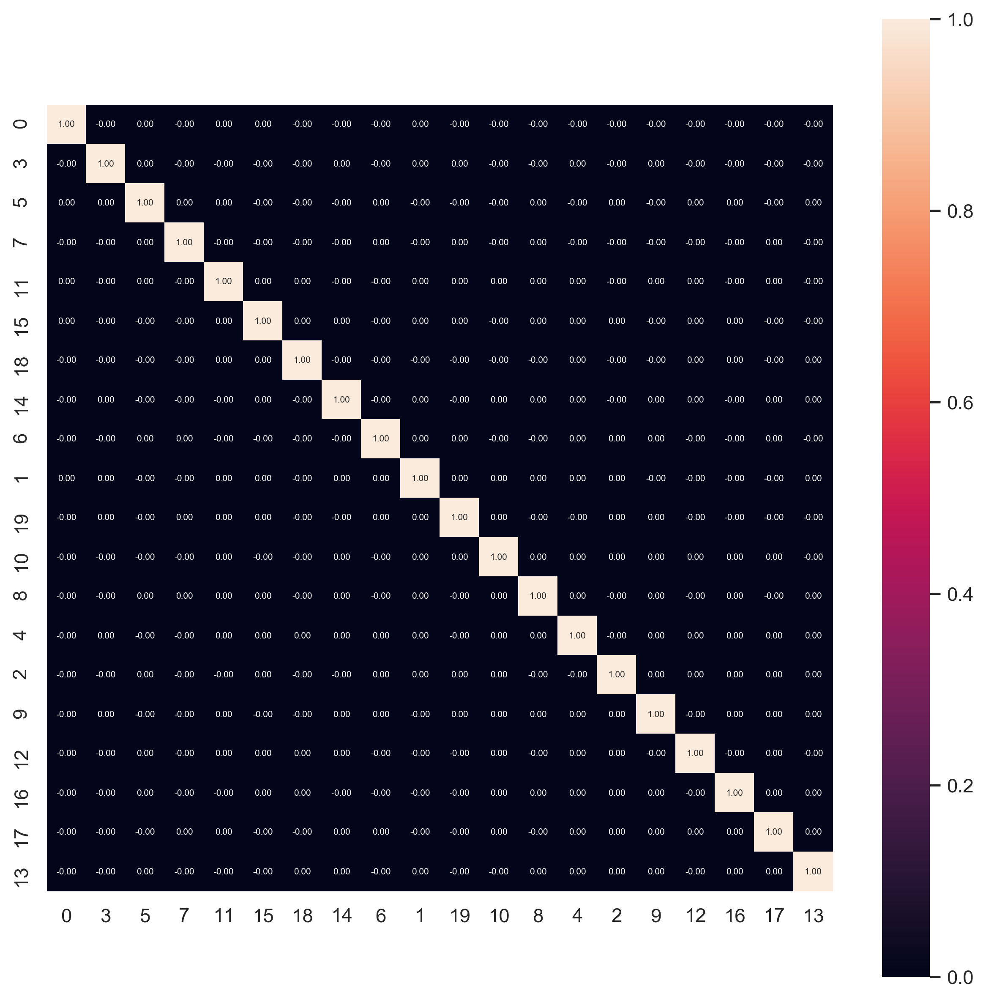

In [309]:
import seaborn as sns
plt.figure(figsize=(10,10),dpi=300)
k = 20
corrmat = x_Kpca.corr()  # 获得相关性矩阵
# 获得相关性最高的 K 个特征
cols = corrmat.nlargest(k, '0')['0'].index
# 获得相关性最高的 K 个特征组成的子数据集
cm = np.corrcoef(x_Kpca[cols].values.T)
# 绘制热图
sns.set(font_scale=1)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={
                 'size': 5}, yticklabels=cols.values, xticklabels=cols.values)
plt.show()

<BarContainer object of 65 artists>

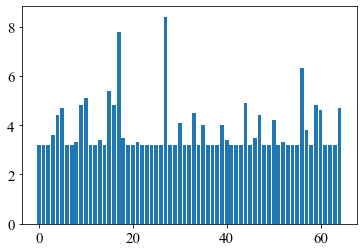

In [587]:
plt.figure()
plt.bar(range(len(test_sul)),test_sul,)

In [65]:
pd.DataFrame(x_pca_rbf).to_csv('x_pca_transform.csv',index=None)

In [42]:
R2_list = []
for i in range(5000):

    #     start_time = time()
    x_pca_rbf = KernelPCA(n_components=20,kernel='rbf',random_state=i+1).fit_transform(x_s)
    x_train,x_test,y_train,y_test = train_test_split(x_pca_rbf,y,test_size=0.2,random_state=i+1)
    # 建模
    # model = SVR(C=10000,kernel='rbf',epsilon=0.5,gamma=1.5)
    model = SVR(kernel='rbf',)
    # 预测
    y_pred = model.fit(x_train,y_train).predict(x_test)
    # R2
    R2 = model.score(x_test,y_test)
    R2_list.append(R2)
#     mse = mean_squared_error(y_test,y_pred)
#     mae = mean_absolute_error(y_test,y_pred)
#   end_time = time()
#   total_time = end_time-start_time
#     print(f'第{i+1}个和第{j+1}个：R2:{R2}, 均方误差:{mse},绝对误差:{mae},运行时间:{round(total_time,6)}')

# 可视化
# fig = plt.figure()
# ax = fig.add_subplot(1,1,1)
# ax.scatter(range(len(y_pred)),y_pred,c='k',marker='o')
# ax.scatter(range(len(y_pred)),y_test,c='',edgecolors='k',marker='o')
# ax.plot(range(len(y_pred)),y_pred,c='r',label='y_pred')
# ax.plot(range(len(y_pred)),y_test,c='g',label='y_test')
# plt.xlabel('new samples')
# plt.ylabel('octane number')
# plt.legend()
# plt.savefig('7.jpg')
# plt.show()

In [43]:
R2_list.index(max(R2_list))

2524

960,0.7793506024002737

In [44]:
max(R2_list)

0.8629126646165468

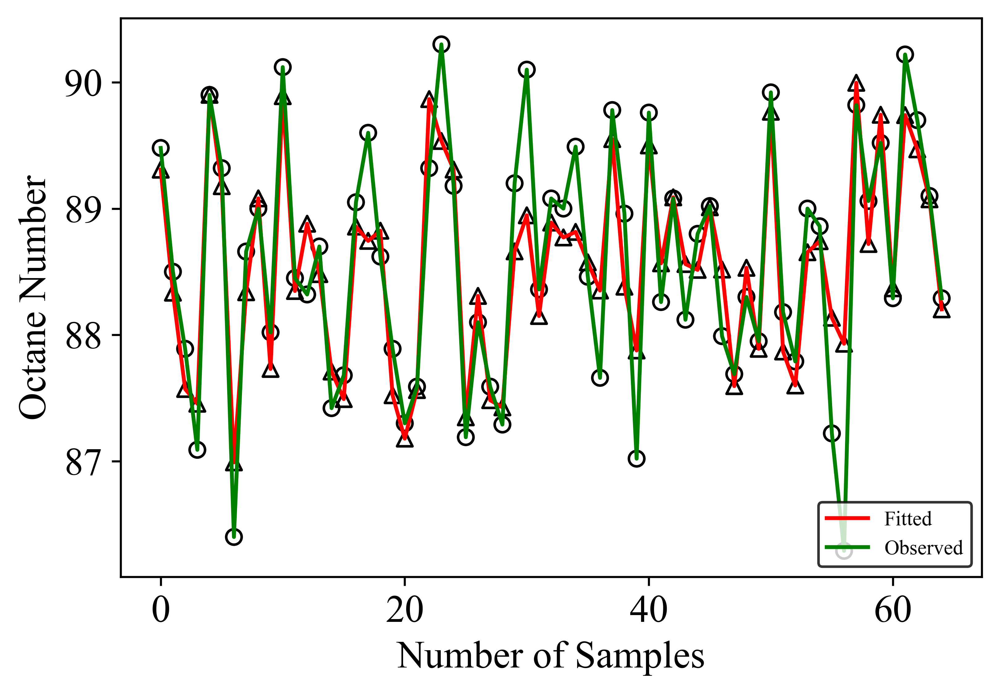

In [492]:
plt.figure(dpi=600)
plt.rcParams['font.sans-serif'] = 'Times New Roman'
# plt.rcParams['figure.dpi']=300
# plt.rcParams['savefig.dpi']=600
plt.rcParams['font.size']=15
# plt.subplot(1,2,1)
plt.scatter(range(len(y_pred)),y_pred,c='',edgecolors='k',marker='^')
plt.scatter(range(len(y_pred)),y_test,c='',edgecolors='k',marker='o')
plt.plot(range(len(y_pred)),y_pred,c='r',label='Fitted')
plt.plot(range(len(y_pred)),y_test,c='g',label='Observed')
plt.xlabel('Number of Samples')
plt.ylabel('Octane Number')
plt.legend(loc='lower right',edgecolor='k',fontsize=8)
plt.savefig('KPCA-SVR(RBF).jpeg')
plt.show()

# 8 Grid Search poly-KPCA-SVR(rbf)

In [10]:
x.shape

(325, 20)

In [47]:
GridSearchCV?

In [140]:
325*0.2

65.0

In [157]:
# def my_scorer(y_test,y_pred,*args):
#     return mean_squared_error(y_test,y_pred)

65.0

In [580]:
# start_time =time()
i=0
y_pred_list = []
while i<30:
    svr=SVR(kernel='rbf',)
    svr_param={'C':list(np.linspace(0.01,10000,50)),'gamma':list(np.linspace(0.01,1000,50))}
    cv = [(slice(None), slice(None))]
    svr_grid=GridSearchCV(svr,param_grid=svr_param,cv=cv,scoring='r2',n_jobs=4)
    svr_grid.fit(x_train,y_train)
    y_pred = svr_grid.predict(x_test)
    y_pred_list.append(np.mean(y_pred))
    i+=1
# R2 = svr_grid.score(x_test,y_test)
# mse = mean_squared_error(y_test,y_pred)
# R2_train = svr_grid.score(x_train,y_train)
# print(R2_train)
# y_pred_cv = svr_grid(x_train,y_train).predict(x_test)
# print(R2)
# end_time = time()
# total_time = end_time-start_time
# print(round(total_time,6))
# print('best_score:',svr_grid.best_score_)                                                                     

In [182]:
print(R2_train)

0.4873796455092997


In [174]:
print(svr_grid.best_score_)
print(svr_grid.best_params_)

-1.4511414912147123
{'C': 888.9, 'gamma': 0.1}


In [68]:
pd.DataFrame(svr_grid.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_gamma,params,split0_test_score,split1_test_score,mean_test_score,std_test_score,rank_test_score
0,0.000997,4.768372e-07,0.000498,4.984140e-04,0.001,0.001,"{'C': 0.001, 'gamma': 0.001}",-0.011646,-0.051403,-0.031524,0.019879,5000
1,0.000499,4.988909e-04,0.000997,7.152557e-07,0.001,2.0418,"{'C': 0.001, 'gamma': 2.0417959183673466}",-0.006546,-0.047806,-0.027176,0.020630,4951
2,0.000495,4.947186e-04,0.000499,4.987717e-04,0.001,4.08259,"{'C': 0.001, 'gamma': 4.082591836734694}",-0.007304,-0.048004,-0.027654,0.020350,4952
3,0.001508,4.868507e-04,0.000000,0.000000e+00,0.001,6.12339,"{'C': 0.001, 'gamma': 6.123387755102041}",-0.008041,-0.048354,-0.028198,0.020157,4953
4,0.000985,1.192093e-05,0.000998,2.384186e-07,0.001,8.16418,"{'C': 0.001, 'gamma': 8.164183673469386}",-0.008561,-0.048665,-0.028613,0.020052,4954
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,0.001994,1.192093e-07,0.000998,1.192093e-07,10000,91.8368,"{'C': 10000.0, 'gamma': 91.83681632653061}",0.268464,0.225668,0.247066,0.021398,4456
4996,0.002493,4.984140e-04,0.000498,4.984140e-04,10000,93.8776,"{'C': 10000.0, 'gamma': 93.87761224489796}",0.263914,0.221635,0.242774,0.021139,4555
4997,0.001995,1.192093e-07,0.000997,0.000000e+00,10000,95.9184,"{'C': 10000.0, 'gamma': 95.9184081632653}",0.259436,0.217736,0.238586,0.020850,4654
4998,0.001995,2.384186e-07,0.000498,4.982948e-04,10000,97.9592,"{'C': 10000.0, 'gamma': 97.95920408163265}",0.255056,0.214041,0.234549,0.020508,4753


In [135]:
sklearn.metrics.SCORERS.keys()

dict_keys(['explained_variance', 'r2', 'max_error', 'neg_median_absolute_error', 'neg_mean_absolute_error', 'neg_mean_squared_error', 'neg_mean_squared_log_error', 'neg_root_mean_squared_error', 'neg_mean_poisson_deviance', 'neg_mean_gamma_deviance', 'accuracy', 'roc_auc', 'roc_auc_ovr', 'roc_auc_ovo', 'roc_auc_ovr_weighted', 'roc_auc_ovo_weighted', 'balanced_accuracy', 'average_precision', 'neg_log_loss', 'neg_brier_score', 'adjusted_rand_score', 'homogeneity_score', 'completeness_score', 'v_measure_score', 'mutual_info_score', 'adjusted_mutual_info_score', 'normalized_mutual_info_score', 'fowlkes_mallows_score', 'precision', 'precision_macro', 'precision_micro', 'precision_samples', 'precision_weighted', 'recall', 'recall_macro', 'recall_micro', 'recall_samples', 'recall_weighted', 'f1', 'f1_macro', 'f1_micro', 'f1_samples', 'f1_weighted', 'jaccard', 'jaccard_macro', 'jaccard_micro', 'jaccard_samples', 'jaccard_weighted'])

In [138]:
GridSearchCV?

In [193]:
start_time =time()
svr=SVR(kernel='rbf',)
svr_param={'C':list(np.linspace(0.1,1000,100)),'gamma':list(np.linspace(0.01,1000,50))}
cv = [(slice(None), slice(None))]
svr_grid=GridSearchCV(svr,param_grid=svr_param,scoring='neg_mean_squared_error',n_jobs=4)
# svr_grid=GridSearchCV(svr,param_grid=svr_param,scoring='neg_mean_squared_error',cv=cv,n_jobs=4)
svr_grid.fit(x_train,y_train)
end_time = time()
total_time = end_time-start_time
print(round(total_time,6))
print('best_score:',svr_grid.best_score_)  

22.69953
best_score: -0.39328800186573815


In [49]:
y_pred = svr_grid.predict(x_test)
R2 = svr_grid.score(x_test,y_test)
mse = mean_squared_error(y_test,y_pred)
mae = mean_absolute_error(y_test,y_pred)
print(R2,mse,mae)

0.7839045719260208 0.17690473972514892 0.3290734896487335


In [53]:
C = svr_grid.best_params_['C']
gamma = svr_grid.best_params_['gamma']

In [54]:
svr_rbf = SVR(kernel='rbf',C=C,gamma=gamma)

In [55]:
print(r2_score(y_test,svr_rbf.fit(x_train,y_train).predict(x_test)))

0.7839045719260208


In [180]:
svr_grid.best_params_

{'C': 111.19999999999999, 'gamma': 0.01}

In [220]:
svr_grid.best_params_

{'C': 13.793965517241379, 'gamma': 6.89748275862069}

In [233]:
svr_grid.best_params_

{'C': 12.24577551020408, 'gamma': 55.10248979591836}

In [195]:
svr_grid.best_params_

{'C': 1.0, 'gamma': 3.04}

In [ ]:
svr_grid.predict(x_test)

In [81]:
y_pred = svr_grid.predict(x_test)
mse = mean_squared_error(y_test,y_pred)
mae = mean_absolute_error(y_test,y_pred)
print(mse,mae)

0.17689388250267873 0.3290615561165881


In [55]:
svr_grid.best_params_

{'C': 102.0, 'gamma': 30.310000000000002}

In [214]:
svr_grid.cv_results_

{'mean_fit_time': array([0.01376233, 0.01316333, 0.01475959, 0.01637115, 0.01874838,
        0.01974654, 0.02154264, 0.02233982, 0.02293787, 0.0241353 ,
        0.02513261, 0.02593036, 0.0259305 , 0.02732692, 0.02912188,
        0.02752666, 0.02932129, 0.02872291, 0.02912846, 0.03031301,
        0.01278157, 0.02253408, 0.02952065, 0.03630261, 0.04049087,
        0.04328413, 0.04189382, 0.04028611, 0.04228687, 0.04448161,
        0.04328442, 0.04268589, 0.03949437, 0.041888  , 0.04049153,
        0.04049177, 0.04092631, 0.04052753, 0.04288502, 0.04232292,
        0.0135994 , 0.02473364, 0.03191433, 0.04308472, 0.04428148,
        0.04268584, 0.04288554, 0.04328408, 0.04488025, 0.0444809 ,
        0.04308462, 0.04288511, 0.04168844, 0.04428163, 0.04069104,
        0.04029398, 0.0408926 , 0.04069295, 0.04288549, 0.04089251,
        0.01236682, 0.02553182, 0.03390918, 0.04547787, 0.04108996,
        0.04328418, 0.04309459, 0.0412797 , 0.04308429, 0.04388261,
        0.04288516, 0.04228697,

In [73]:
len(svr_grid.cv_results_['mean_test_score'])

100

In [51]:
SVR?

D:\anaconda\conda\lib\site-packages\ipykernel_launcher.py:17: UserWarning: The following kwargs were not used by contour: 'linewidth'


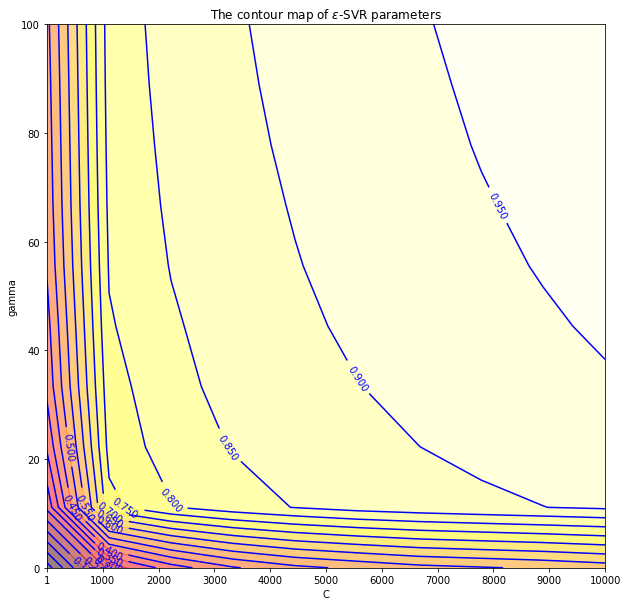

<Figure size 432x288 with 0 Axes>

In [95]:
## 等高线图确定全局最优范围
def contourmap(C,gamma,grid_scores):
    x=np.array(C)
    y=np.array(gamma)
    gs=[k for k in grid_scores]
    scores=[];score=[]
    for index, value in enumerate(gs):
        if index > 0 and index % (len(x)) == 0:
            scores.append(score)
            score=[]
        score.append(value)
        if index==(len(gs)-1):
            scores.append(score)
    X,Y=np.meshgrid(x,y)
    plt.figure(figsize=(10,10))
    plt.contourf(X,Y,scores,20,alpha=0.5,cmap=plt.cm.hot)
    C=plt.contour(X,Y,scores,20,colors='b',linewidth=0.5)
    plt.clabel(C,fontsize=10,)
    plt.xlabel('C')
    plt.ylabel('gamma')
    plt.xticks([1,1000,2000,3000,4000,5000,6000,7000,8000,9000,10000])
    plt.yticks([0,20,40,60,80,100])
    plt.title('The contour map of $\epsilon$-SVR parameters')
    plt.show()
    plt.savefig('contour.jpg')
# 绘制等高线图
C_value = list(np.linspace(1,10000,10))
gamma_value = list(np.linspace(0.01,100,10))
grid_scores = svr_grid.cv_results_['mean_test_score']
contourmap(C_value,gamma_value,grid_scores)

# 9.GS-PSO-KPCA-SVR

In [122]:
x_train.shape

(260, 349)

In [115]:
SVR?

In [96]:
a = np.linspace(0.1,2000,100).reshape(100,1)
b = np.linspace(0.001,1000,100).reshape(100,1)
x = np.hstack((a,b))

In [97]:
x

array([[1.00000000e-01, 1.00000000e-03],
       [2.03010101e+01, 1.01020000e+01],
       [4.05020202e+01, 2.02030000e+01],
       [6.07030303e+01, 3.03040000e+01],
       [8.09040404e+01, 4.04050000e+01],
       [1.01105051e+02, 5.05060000e+01],
       [1.21306061e+02, 6.06070000e+01],
       [1.41507071e+02, 7.07080000e+01],
       [1.61708081e+02, 8.08090000e+01],
       [1.81909091e+02, 9.09100000e+01],
       [2.02110101e+02, 1.01011000e+02],
       [2.22311111e+02, 1.11112000e+02],
       [2.42512121e+02, 1.21213000e+02],
       [2.62713131e+02, 1.31314000e+02],
       [2.82914141e+02, 1.41415000e+02],
       [3.03115152e+02, 1.51516000e+02],
       [3.23316162e+02, 1.61617000e+02],
       [3.43517172e+02, 1.71718000e+02],
       [3.63718182e+02, 1.81819000e+02],
       [3.83919192e+02, 1.91920000e+02],
       [4.04120202e+02, 2.02021000e+02],
       [4.24321212e+02, 2.12122000e+02],
       [4.44522222e+02, 2.22223000e+02],
       [4.64723232e+02, 2.32324000e+02],
       [4.849242

In [89]:
x.shape

(100, 2)

In [575]:
# PSO参数优化
class PSO(object):
    def __init__(self, population_size, max_steps):
        self.w_max=0.9  # 惯性权重
        self.w_min = 0.4
        self.c1=self.c2 = 1.5
        self.population_size=population_size  # 粒子群数量
        self.dim=2  # 搜索空间的维度
        self.max_steps=max_steps  # 迭代次数
        self.x_bound=[0.1,10000]  # 解空间范围
#         self.a = np.random.uniform(1,10000,(100,1))
#         self.b = np.random.uniform(0.1,100,(100,1))
#         self.x = np.hstack((self.a,self.b))
#         self.a = np.linspace(0.01,2000,10).reshape(10,1)
#         self.b = np.linspace(0.001,1000,10).reshape(10,1)
#         self.x = np.hstack((self.a,self.b))
        self.x=np.random.uniform(self.x_bound[0], self.x_bound[1],
                                (self.population_size, self.dim))  # 初始化粒子群位置
        self.v=np.random.rand(self.population_size, self.dim)  # 初始化粒子群速度
        fitness,best_param,R2,RMSE,mape,y_pred_=self.calculate_fitness(self.x)
        self.p=self.x # 个体的最佳位置
        self.param=best_param # 记录个体最佳参数
        self.individual_best_fitness=fitness  # 个体的最优适应度
        self.fitness_score=[]
        self.R2_list = []
        self.RMSE_list = []
        self.MAPE_list = []
        self.y_pred = []
    ###定义目标损失函数
    def calculate_fitness(self,x):
#         param_grid={'C':list(abs(x[:,0])),'gamma':list(abs(x[:,1])),'degree':[2,3,4,5]}
        param_grid={'C':list(x[:,0]),'gamma':list(x[:,1])}
#         param_grid={'C':list(abs(x[:,0])),"gamma":list(np.linspace(0.001,1000,50))}
        cv = [(slice(None), slice(None))]
        svr=GridSearchCV(SVR(kernel='rbf'), param_grid, n_jobs=4, cv=cv, scoring='r2')
        svr.fit(x_train,y_train)
#         svr.fit(x_pca_rbf,y)
        y_pred = svr.predict(x_test)
        R2 = r2_score(y_test,y_pred)
        mape1 = mape(y_test,y_pred)
        RMSE = np.sqrt(mean_squared_error(y_test, y_pred))
        grid_scores=svr.best_score_
        best_param=svr.best_params_
        print(f'R2:{R2},平均绝对误差:{mape1}')
        print('RMSE:{}'.format(np.sqrt(mean_squared_error(y_test, y_pred))))
        return grid_scores,best_param,R2,RMSE,mape1,np.mean(y_pred)
#         return grid_scores

    def evolve(self):
        fitness_all = []
        best_parmas_list = []
#         fig = plt.figure()
        for step in range(self.max_steps):
            r1=np.random.rand(self.population_size,self.dim)
            r2=np.random.rand(self.population_size,self.dim)
            w = self.w_max-0.5*step/self.max_steps
            # 更新速度和权重
            self.v=w*self.v+(self.c1*r1+self.c2*r2)*(self.p-self.x)
#             self.v=w*self.v+self.c1*r1*(self.p-self.x)
            self.x=self.v+self.x
#             # 粒子变化散点图
#             plt.clf()
#             plt.scatter(self.x[:, 0],self.x[:, 1],s=30,color='k')
#             plt.xlabel('Parameter C')
#             plt.ylabel('Parameter gamma')
#             plt.title('Particle motion scatter plot')
# #             plt.xlim(self.x_bound[0],self.x_bound[1])
# #             plt.ylim(self.x_bound[0],self.x_bound[1])
#             plt.show()
#             plt.pause(10)
            fitness,best_param,R2,RMSE,mape,y_pred=self.calculate_fitness(self.x)
            best_parmas_list.append(best_param)
            self.R2_list.append(R2)
            self.RMSE_list.append(RMSE)
            self.MAPE_list.append(mape)
            self.y_pred.append(y_pred)
            # 需要更新的个体
            if fitness>self.individual_best_fitness:
                self.p=self.x
#                 self.param=best_param
                self.individual_best_fitness=fitness
            self.fitness_score.append(self.individual_best_fitness)
        fitness_all.append(self.fitness_score)
        # 绘制迭代次数与适应度误差相关曲线
#         x_axis=[i for i in range(self.max_steps)]
#         plt.figure(figsize=(15,9))
#         plt.plot(x_axis,self.fitness_score,'-^b')
#         plt.xlabel('Iterative number')
#         plt.ylabel('MSE')
# #         plt.title('Iterative error plot')
#         plt.grid()
#         plt.show()
        return self.param,self.individual_best_fitness,fitness_all,best_parmas_list,self.R2_list,self.RMSE_list,self.MAPE_list,self.y_pred
# 对象实现局部搜索
# def main():
# 等高线图粗略选择
# contourmap(C_value, gamma_value, grid_scores)
# PSO参数选取
start_time = time()
my_pso=PSO(50,20)
local_best_param,best_score,fitness_all_,best_parmas_list_,R2_list,RMSE_list,MAPE_list,Y_pred=my_pso.evolve()
end_time = time()
total_time = end_time-start_time
print(total_time)
# local_best_C,local_best_gamma=local_best_param['C'],local_best_param['gamma']
# local_best_C = local_best_param['C']
# 得到局部最佳参数的回归器
# Advanced_svr=SVR(kernel='rbf',C=local_best_C,gamma=local_best_gamma)
# Advanced_svr=SVR(kernel='rbf',C=local_best_C,)
# Advanced_svr.fit(x_train,y_train)
# y_pred=Advanced_svr.predict(x_test)
# # R2
# R2 = Advanced_svr.score(x_test,y_test)
# mse = mean_squared_error(y_test,y_pred)
# mae = mean_absolute_error(y_test,y_pred)
# end_time = time()
# total_time = end_time-start_time
# print(f'R2:{R2}, 均方误差:{mse},绝对误差:{mae},运行时间:{round(total_time,4)}')
# # 可视化
# fig = plt.figure()
# ax = fig.add_subplot(1,1,1)
# ax.scatter(range(len(y_pred)),y_pred,c='k',marker='o')
# ax.scatter(range(len(y_pred)),y_test,c='',edgecolors='k',marker='o')
# ax.plot(range(len(y_pred)),y_pred,c='r',label='y_pred')
# ax.plot(range(len(y_pred)),y_test,c='g',label='y_test')
# plt.xlabel('new samples')
# plt.ylabel('octane number')
# plt.legend()
# plt.show()
# plt.savefig('7.jpg')
# Advanced_svr_load=scaler_load.inverse_transform(Advanced_svr_load)
# Advanced_svr_load=np.reshape(Advanced_svr_load,(-1,1))
# pre_result=np.concatenate((Advanced_svr_load,actual_load),axis=1)
# print(pre_result)


R2:-0.052915791336067164,平均绝对误差:0.41307964414300236
RMSE:0.4455477312771044
R2:-0.05292006585373965,平均绝对误差:0.4130808183425434
RMSE:0.44554863567028286
R2:-0.05291708131572492,平均绝对误差:0.41307999850225297
RMSE:0.4455480042083961
R2:-0.05324335577005623,平均绝对误差:0.4131694882823474
RMSE:0.44561703133052655
R2:-0.05325204132749706,平均绝对误差:0.41317186678414264
RMSE:0.44561886871422407
R2:-0.05291586207373311,平均绝对误差:0.413079663574852
RMSE:0.4455477462436413
R2:-0.0529159790462701,平均绝对误差:0.4130796957075312
RMSE:0.44554777099246057
R2:-0.05291578440574596,平均绝对误差:0.41307964223922156
RMSE:0.4455477298108006
R2:-0.05325226126992222,平均绝对误差:0.4131719270118924
RMSE:0.44561891524178143
R2:-0.05324306877001872,平均绝对误差:0.4131694096853353
RMSE:0.4456169706170586
R2:-0.05291938244574235,平均绝对误差:0.41308063061522443
RMSE:0.4455484910764243
R2:-0.05291618183334523,平均绝对误差:0.4130797514136171
RMSE:0.4455478138977478
R2:-0.05291578883025605,平均绝对误差:0.4130796434546483
RMSE:0.4455477307469298
R2:-0.053224803346089145,平均绝对

In [554]:
print(np.mean(y_test))

88.41369230769232


In [560]:
Y_pred

[88.45945883250155,
 88.45999571617428,
 88.46044456698392,
 88.46020838676914,
 88.4600833099329,
 88.46005376447728,
 88.46020172428086,
 88.46033917143917,
 88.46029318219112,
 88.4601960050035,
 88.46013581836287,
 88.46014929622517,
 88.46026129198626,
 88.46024990748973,
 88.4601983990575,
 88.46020220994727,
 88.46020922875691,
 88.46023002329946,
 88.46024174043484,
 88.46017294271562]

In [558]:
Y_pred

[88.47730852603245,
 88.4764955418691,
 88.47577607454491,
 88.47517605091176,
 88.47473152125173,
 88.47439794886495,
 88.47467858486978,
 88.47493551193783,
 88.47511788524746,
 88.47493619700062,
 88.47479456443497,
 88.47467241361157,
 88.47488758522965,
 88.47492642824288,
 88.47498022961452,
 88.4749073655439,
 88.47486351225014,
 88.47492270294633,
 88.47493634076693,
 88.47494060745171]

In [552]:
for i in Y_pred:
    print(np.mean(i))

88.47056413199725
88.47049990396332
88.47403065394988
88.47762039772398
88.4770016923826
88.47100524822923
88.46640026646953
88.4622964272863
88.46177714344292
88.4611492403934
88.4604837858662
88.46007381053748
88.45911195594968
88.45870354418852
88.45851048150396
88.45821511570627
88.45800666314385
88.45785800787385
88.45787471129269
88.45783373610202
88.45781020660831
88.4577720593111
88.45774470157566
88.45770795985646
88.45766677776467
88.45768761304541
88.45772764439585
88.45770888344829
88.45775466433469
88.45770537108501
88.45770044477281
88.45770137544766
88.45767744667943
88.4576894560308
88.45769056360723
88.45769205460651
88.45770517715378
88.45770544059349
88.45771831325969
88.45771080152502
88.45771687607166
88.45772787763097
88.45772244346249
88.45767431135933
88.45769790271683
88.45768245109718
88.45766450319304
88.45765854976138
88.45768244695003
88.45770059486571


In [161]:
R2_1 = R2_list

In [131]:
pd.DataFrame(R2_1).to_csv('R2.csv',index=None)

In [179]:
639.2478437423706*4

2556.9913749694824

In [555]:
best_parmas_list_

[{'C': 4.306722144515869, 'gamma': 23.079301690720524},
 {'C': 4.1255340765573605, 'gamma': 23.443154552184048},
 {'C': 3.6706965621028407, 'gamma': 21.39479557079617},
 {'C': 3.2749879245274087, 'gamma': 19.612723256988716},
 {'C': 2.934678496212537, 'gamma': 18.080141067114305},
 {'C': 2.6454154821448963, 'gamma': 16.777446205721056},
 {'C': 2.4024345503280777, 'gamma': 15.683182522150727},
 {'C': 2.2007603769201185, 'gamma': 14.774943664787353},
 {'C': 2.0353875547255917, 'gamma': 14.030187801749387},
 {'C': 1.901435568748025, 'gamma': 13.426935552688635},
 {'C': 1.794273979965972, 'gamma': 12.944333753440032},
 {'C': 1.7096163248281497, 'gamma': 12.563078332033637},
 {'C': 1.6435833538206486, 'gamma': 12.26569910333665},
 {'C': 1.5927379661448726, 'gamma': 12.036717097239968},
 {'C': 1.554095471511283, 'gamma': 11.862690772606491},
 {'C': 1.5251136005360906, 'gamma': 11.732171029131383},
 {'C': 1.5036670160144483, 'gamma': 11.635586418959802},
 {'C': 1.4880110093136494, 'gamma': 11

In [208]:
best_params_1 = best_parmas_list_ # 种群为100，cv=3[0.1,100]

In [209]:
best_params_1

[{'C': 12.209736031513598, 'gamma': 11.505482819951142},
 {'C': 12.139946252012523, 'gamma': 11.761399760165423},
 {'C': 11.716930929432934, 'gamma': 9.935552761421132},
 {'C': 11.339389754030652, 'gamma': 8.305984315041853},
 {'C': 11.00337810792262, 'gamma': 6.855668397764294},
 {'C': 10.705167772001742, 'gamma': 5.56851302118046},
 {'C': 10.441251624711764, 'gamma': 4.4293805129037676},
 {'C': 10.20834562472836, 'gamma': 3.424096074349586},
 {'C': 10.003388344742962, 'gamma': 2.5394457684219063},
 {'C': 9.823538331555778, 'gamma': 1.7631651249703673},
 {'C': 9.66616957001699, 'gamma': 1.0839195619502706},
 {'C': 16.30073808456183, 'gamma': 0.49127780821523626},
 {'C': 9.409410632909344, 'gamma': 14.585011991216524},
 {'C': 9.442232991899518, 'gamma': 14.621062293763329},
 {'C': 9.605821224138875, 'gamma': 0.8188071336169231},
 {'C': 9.61841584081426, 'gamma': 1.0778202516887416},
 {'C': 16.253570935649435, 'gamma': 0.47494441244270735},
 {'C': 9.330007625537746, 'gamma': 14.56179537

In [210]:
params_C = []
params_g = []
for dict in best_params_1:
    params_C.append(dict['C'])
    params_g.append(dict['gamma'])
        

In [133]:
pd.DataFrame(params_C).to_csv('C.csv',index=None)

In [54]:
best_parmas_list_

[{'C': 5.597984046521412, 'gamma': 1.185419997672799},
 {'C': 7.645158162880885, 'gamma': 1.8390778834596244},
 {'C': 8.087591259436822, 'gamma': 2.7190233254858494},
 {'C': 8.45259856409547, 'gamma': 2.8530646787864375},
 {'C': 8.74460440782239, 'gamma': 3.3493839843896716},
 {'C': 5.850608694946597, 'gamma': 3.5665082113454325},
 {'C': 8.865272661944209, 'gamma': 3.485739856834783},
 {'C': 8.550092052679105, 'gamma': 3.0189990263197712},
 {'C': 8.329465626193533, 'gamma': 2.7952484424631376},
 {'C': 8.760148514284293, 'gamma': 2.845125417244649},
 {'C': 8.708997973867133, 'gamma': 3.436076425444566},
 {'C': 8.514218983065991, 'gamma': 3.2484245673957255},
 {'C': 8.397351588585305, 'gamma': 3.135833452566421},
 {'C': 8.330152836758911, 'gamma': 3.071093561539571},
 {'C': 8.355835434291484, 'gamma': 3.1793492833590404},
 {'C': 8.369318797996085, 'gamma': 3.236183537314262},
 {'C': 8.368012794289715, 'gamma': 3.216665893752971},
 {'C': 8.339134308729593, 'gamma': 3.1069398228010052},
 {

c=x,g=y,z=r2

In [98]:
from mpl_toolkits import mplot3d

In [184]:
pd.DataFrame(np.hstack((R2_list,RMSE_list,MAPE_list))).to_csv('metrics.csv',index=None)

In [ ]:
pd.DataFrame()

In [174]:
plt.yticks?

In [178]:
np.linspace(0.1,0.9,50)

array([0.1       , 0.14210526, 0.18421053, 0.22631579, 0.26842105,
       0.31052632, 0.35263158, 0.39473684, 0.43684211, 0.47894737,
       0.52105263, 0.56315789, 0.60526316, 0.64736842, 0.68947368,
       0.73157895, 0.77368421, 0.81578947, 0.85789474, 0.9       ])

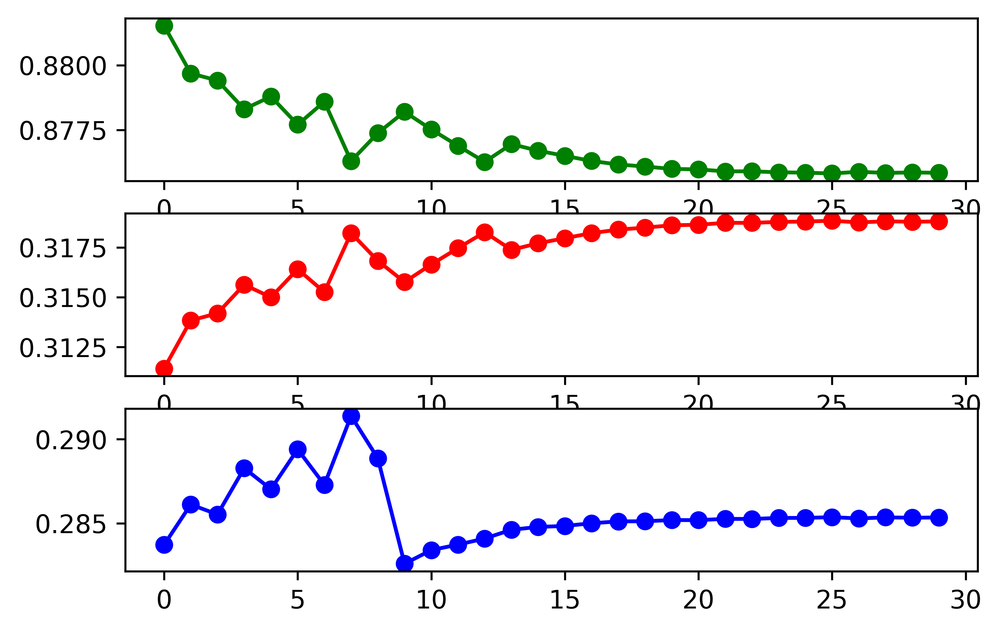

In [182]:
plt.figure(dpi=600)
plt.subplot(3,1,1)
plt.plot(range(len(R2_1[:30])),R2_1[:30],'o-g',label='$R^2$')
plt.subplot(3,1,2)
plt.plot(range(len(R2_1[:30])),RMSE_list[:30],'o-r',label='$R^2$')
plt.subplot(3,1,3)
plt.plot(range(len(R2_1[:30])),MAPE_list[:30],'o-b',label='$R^2$')
plt.show()

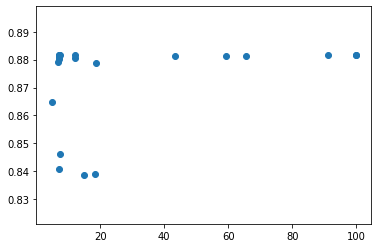

In [142]:
plt.scatter(x1,r2)

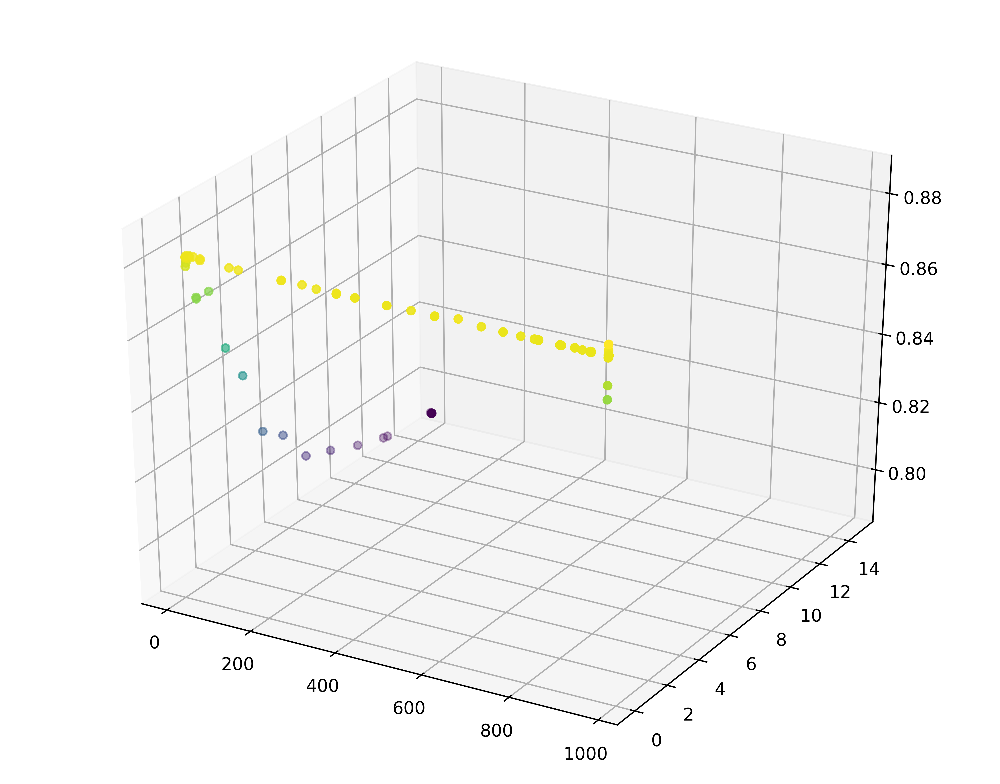

In [220]:
x1 = params_C
y1 = params_g
r2 = R2_list
# rmse = RMSE_list
# mape = MAPE_list
plt.figure(figsize=(10,8),dpi=600)
ax1 = plt.axes(projection='3d')
# ax1.plot3D(x1, y1, r2, 'gray')
ax1.scatter(params_C,params_g,R2_list,cmap='viridis',c=R2_list,)

# ax1.plot3D(x1,y1,r2)
# ax.plot_trisurf(x1, y1, r2, cmap='viridis', )

In [100]:
def f(x, y):
    return np.sin(np.sqrt(x ** 2 + y ** 2))

In [ ]:
['bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'seaborn-bright',
 'seaborn-colorblind',
 'seaborn-dark-palette',
 'seaborn-dark',
 'seaborn-darkgrid',
 'seaborn-deep',
 'seaborn-muted',
 'seaborn-notebook',
 'seaborn-paper',
 'seaborn-pastel',
 'seaborn-poster',
 'seaborn-talk',
 'seaborn-ticks',
 'seaborn-white',
 'seaborn-whitegrid',
 'seaborn',
 'Solarize_Light2',
 'tableau-colorblind10',
 '_classic_test']

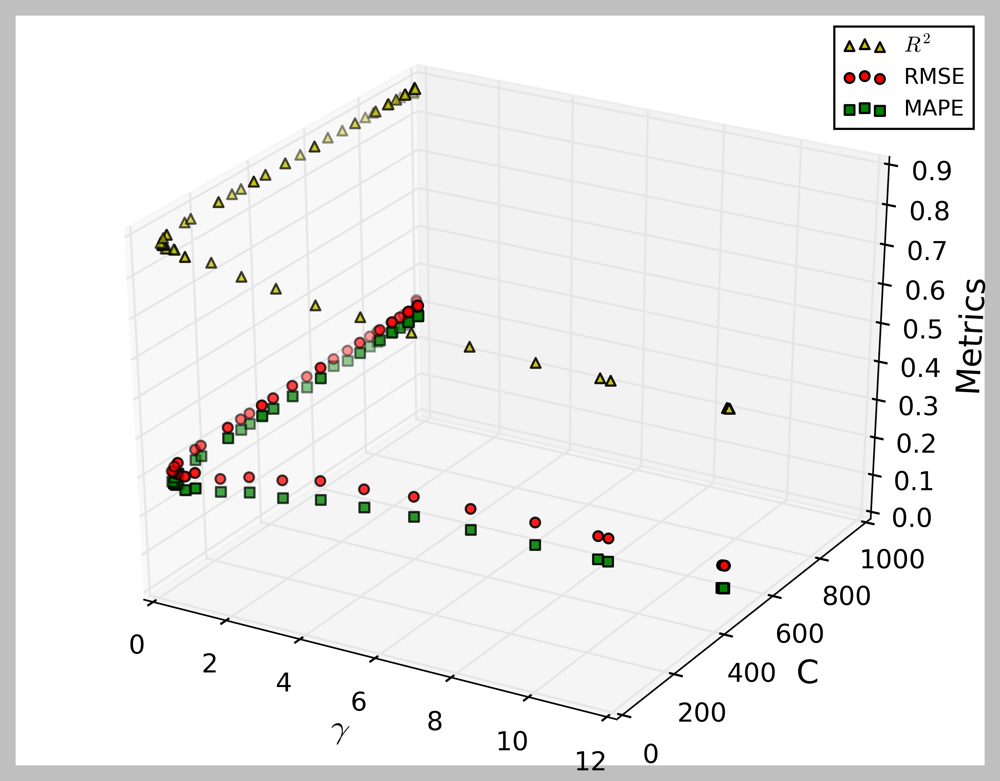

In [278]:
plt.rcParams['font.size']=15
plt.rcParams['font.sans-serif'] = 'Times New Roman'
plt.style.use('classic')
fig = plt.figure(dpi=600,)
ax1 = fig.gca(projection='3d')
# ax1 = plt.axes(projection='3d')
# ax1.plot3D(params_g, params_C, R2_list, 'gray')
ax1.scatter(params_g,params_C,R2_list,cmap='viridis',c='y',label='$R^2$',marker='^')
ax1.scatter(params_g,params_C,RMSE_list,cmap='viridis',c='r',label='RMSE',marker='o')
ax1.scatter(params_g,params_C,MAPE_list,cmap='viridis',c='g',label='MAPE',marker='s')
ax1.set_xlim3d(0, 12)
ax1.set_ylim3d(0, 1000)
ax1.set_zlim3d(0, 0.9)
ax1.set_xlabel('$\gamma$',fontsize=15)
ax1.set_ylabel('C',fontsize=15)
ax1.set_zlabel('Metrics',fontsize=15)
plt.legend(loc='upper right',fontsize=10)
plt.savefig('PSO-metrics.jpeg',bbox_inches='tight')
plt.show()

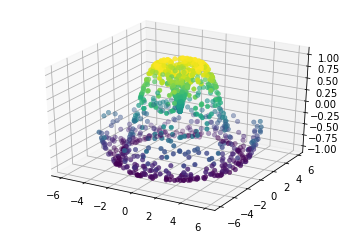

In [101]:
# ax = plt.axes(projection='3d')
theta = 2 * np.pi * np.random.random(1000)
r = 6 * np.random.random(1000)
x = np.ravel(r * np.sin(theta))
y = np.ravel(r * np.cos(theta))
z = f(x, y)

ax = plt.axes(projection='3d')
ax.scatter(x, y, z, c=z, cmap='viridis', linewidth=0.5)

In [78]:
neg_MSE = fitness_all
pd.DataFrame(np.transpose(neg_MSE)).to_csv('neg_MSE.csv',index=None)

In [110]:
linear_fitness_values = fitness_all_

In [120]:
nn = np.transpose(linear_fitness_values)

In [134]:
pd.DataFrame(nn).to_csv('linear_f.csv')

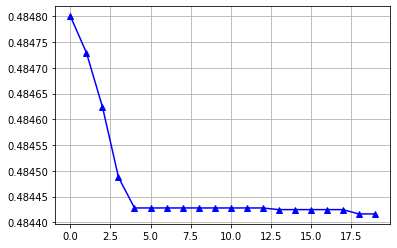

In [121]:
plt.figure()
plt.plot(np.arange(20),nn,'-^b')
plt.grid()
plt.show()

In [261]:
rbf_values_1 = fitness_all_

In [262]:
pd.DataFrame(np.transpose(rbf_values_1)).to_csv('rbf_fitness_values_0.csv')

In [155]:
local_best_param

{'C': 20.970237975283666, 'gamma': 0.7590187441238816}

In [137]:
fitness_all_

[[0.9999998972858996,
  0.9999998798189,
  0.9999998786649209,
  0.9999998786649209,
  0.9999998763621747,
  0.9999998763621747,
  0.9999998763621747,
  0.9999998763621747,
  0.9999998763621747,
  0.9999998763621747,
  0.9999998763621747,
  0.9999998763621747,
  0.9999998763621747,
  0.9999998763621747,
  0.9999998763621747,
  0.9999998763621747,
  0.9999998763621747,
  0.9999998763621747,
  0.9999998763621747,
  0.9999998763621747]]

In [191]:
best_score

0.5622893517875514

In [153]:
best_score

0.6212454147865487

In [192]:
Advanced_svr=SVR(kernel='rbf',C=local_best_param['C'],gamma=local_best_param['gamma'])
Advanced_svr.fit(x_train,y_train)
y_pred=Advanced_svr.predict(x_test)
# R2
R2 = Advanced_svr.score(x_test,y_test)
mse = mean_squared_error(y_test,y_pred)
mae = mean_absolute_error(y_test,y_pred)
end_time = time()
# total_time = end_time-start_time
print(f'R2:{R2}, 均方误差:{mse},绝对误差:{mae},')
# # 可视化
# fig = plt.figure()
# ax = fig.add_subplot(1,1,1)
# ax.scatter(range(len(y_pred)),y_pred,c='k',marker='o')
# ax.scatter(range(len(y_pred)),y_test,c='',edgecolors='k',marker='o')
# ax.plot(range(len(y_pred)),y_pred,c='r',label='y_pred')
# ax.plot(range(len(y_pred)),y_test,c='g',label='y_test')
# plt.xlabel('new samples')
# plt.ylabel('octane number')
# plt.legend()
# plt.show()

R2:0.7721593843198437, 均方误差:0.1865198406785226,绝对误差:0.3376432328839496,


In [275]:
308.311*4

1233.244

In [111]:
fitness_all_

[[0.9901516441927461,
  0.9901516441927461,
  0.9901516441927461,
  0.9901516441927461,
  0.9901516393152403,
  0.9901516251512283,
  0.99015161453906,
  0.9901516068314599,
  0.990151601447853,
  0.9901515977870922,
  0.9901515954193021,
  0.9901515939425829,
  0.990151593060586,
  0.9901515925409835,
  0.990151592255597,
  0.9901515921104256,
  0.9901515920388553,
  0.9901515920008124,
  0.9901515920008124,
  0.9901515920002517]]

In [53]:
# data = pd.read_csv('503afterwash2.csv',encoding='utf-8',index_col='YMD')
# data.index = pd.to_datetime(data.index)
# datanp = np.array(data.as_matrix(columns = ['BOD5_ET','COD_ET','TN_ET', 'TP_ET','NH4_N_ET']))[367:587]

# datain,dataout = np.split(datanp,(4,), axis=1)#分割输入输出
# clf = svm.SVR(kernel='linear', C=0.1,epsilon=0.01)#0.1 0.1 0.1就超越了贝叶斯 C影响较大，C越大运行越慢，epsilon越大运行越快 都在(0,0.3]之间取值
#返回五次迭代的平均分 通过决定系数的平均分来评定模型的好坏
def kfoldtest(clf):
	r2s = []
	corrs = []
	kf=KFold(5,shuffle=False,random_state=0)
# 	x = datain
# 	y = dataout
	for train_index, test_index in kf.split(x,y):
		X_train, X_test, y_train, y_test = x[train_index], x[test_index], y[train_index], y[test_index]
		clf.fit(X_train,y_train)
		predicted = clf.predict(X_test)
		r2 = round(r2_score(predicted,y_test),3)
		r2s.append(r2)
		# print('r2_score2:',round(r2_score(predicted,y_test),3))
		b = []
		for i in y_test.tolist():
			b.append(i)
		d = {
       		'predict':predicted.tolist(),
       		'true':b
		}
		datacor = pd.DataFrame(d)
		corr = round(datacor.corr(method='pearson')['predict'][1],5)
		corrs.append(corr)
	print('r2_array:     ',r2s)
	print('corrs_array:   ',corrs)
	return np.array(r2s),np.array(corrs)
def getsvr(list):
	return svm.SVR(kernel='poly', C=list[0],epsilon=list[1])
print(kfoldtest(getsvr([10,0.0001])))


r2_array:      [-3.962, -33.137, -6.238, -1.709, -0.754]
corrs_array:    [0.1916, 0.0904, -0.21009, -0.22378, -0.19955]
(array([ -3.962, -33.137,  -6.238,  -1.709,  -0.754]), array([ 0.1916 ,  0.0904 , -0.21009, -0.22378, -0.19955]))


D:\anaconda\conda\lib\site-packages\sklearn\model_selection\_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


In [ ]:

#***************************LPSO*************************************
birds=8#10只鸟
xcount=2#2个维度
pos=[]#坐标[[],[],[],[],[]...........] 每只鸟的位置
speed=[]#速度[[],[],[],[],[]..........] 每只鸟的速度
bestpos=[]#这只鸟最好的坐标。[[],[],[],[]......]每一个元素装着对应鸟自己的最好的位置
birdsbestpos=[]#所有鸟目前最好的坐标。[]这个list装着所有鸟最好的位置
w=0.8#权重
c1=2 #学习因子，通常为2
c2=2#学习因子
r1=0.6#通常为0到1的随机数
r2=0.3
for i in range(birds):
    pos.append([])
    speed.append([])
    bestpos.append([])

def GenerateRandVec(list):
    for i in range(xcount):
        list.append(random.uniform(0,5))

for i in range(birds):          #initial all birds' pos,speed
    GenerateRandVec(pos[i])
    GenerateRandVec(speed[i])
    bestpos[i]=copy.deepcopy(pos[i])
        
def FindBirdsMostPos():         #找所有鸟的最佳位置，这是下一次迭代的标准
    best=kfoldtest(getsvr((bestpos[0])))
    index=0
    for i in range(birds):
        temp=kfoldtest(getsvr((bestpos[i])))
        if temp>best:
            best=temp
            index=i
    return bestpos[index]

birdsbestpos=FindBirdsMostPos()   #initial birdsbestpos

def NumMulVec(num,list):         # 常数乘以向量
    for i in range(len(list)):
        list[i]*=num             #（vi1,vi2,vi1,vi2,vi1)→w*(vi1,vi2,vi1,vi2,vi1)

    return list

def VecSubVec(list1,list2):       #向量减去向量
    for i in range(len(list1)):
        list1[i]-=list2[i]
    return list1

def VecAddVec(list1,list2):      #向量加上向量
    for i in range(len(list1)):
        list1[i]+=list2[i]
    return list1

def VecAddVec1(list1,list2):      #向量加上向量 更新位置专用
	list3 = list1.copy()
	for i in range(len(list1)):
		list1[i]+=list2[i]
	if list1[0]>0 and list1[1]>0: #and list1[0]<0.4 and list1[1]<0.4:
		return list1
	list1 = list3.copy()
	return list1

def UpdateSpeed():
    #global speed
    for i in range(birds):
        temp1=NumMulVec(w,speed[i][:])
        temp2=VecSubVec(bestpos[i][:],pos[i])
        temp2=NumMulVec(c1*r1,temp2[:])
        temp1=VecAddVec(temp1[:],temp2)
        temp2=VecSubVec(birdsbestpos[:],pos[i])
        temp2=NumMulVec(c2*r2,temp2[:])
        speed[i]=VecAddVec(temp1,temp2)
        
def UpdatePos(n):
    global bestpos,birdsbestpos
    for i in range(birds):
        pos[i] = VecAddVec1(pos[i],speed[i])
        # print(pos[i])
        #如果更新的位置比原来的好，就替换，更新局部最优
        if  kfoldtest(getsvr((pos[i])))>kfoldtest(getsvr((bestpos[i]))):
            bestpos[i]=copy.deepcopy(pos[i])
    #及时跟新全局最优
    birdsbestpos=FindBirdsMostPos()
    w = 0.8+0.5*((1-(n/100)**2)**5)
    
for i in range(50):
    #print birdsbestpos
    print(i,birdsbestpos,kfoldtest(getsvr(birdsbestpos)))
    UpdateSpeed()
    UpdatePos(i)

D:\anaconda\conda\lib\site-packages\sklearn\model_selection\_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning
